In [4]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale
import xgboost
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_auc_score
import warnings
warnings.filterwarnings('ignore')

In [3]:
!pip install xgboost

Defaulting to user installation because normal site-packages is not writeable


In [6]:
# import the data 
df1= pd.read_csv("telecommunications_churn.csv")
df1.head()

,account_length,voice_mail_plan,voice_mail_messages,day_mins,evening_mins,night_mins,international_mins,customer_service_calls,international_plan,day_calls,day_charge,evening_calls,evening_charge,night_calls,night_charge,international_calls,international_charge,total_charge,churn
0,128,1,25,265.1,197.4,244.7,10.0,1,0,110,45.07,99,16.78,91,11.01,3,2.70,75.56,0
1,107,1,26,161.6,195.5,254.4,13.7,1,0,123,27.47,103,16.62,103,11.45,3,3.70,59.24,0
2,137,0,0,243.4,121.2,162.6,12.2,0,0,114,41.38,110,10.30,104,7.32,5,3.29,62.29,0
3,84,0,0,299.4,61.9,196.9,6.6,2,1,71,50.90,88,5.26,89,8.86,7,1.78,66.80,0
4,75,0,0,166.7,148.3,186.9,10.1,3,1,113,28.34,122,12.61,121,8.41,3,2.73,52.09,0


In [7]:
df1.columns

Index(['account_length', 'voice_mail_plan', 'voice_mail_messages', 'day_mins',
       'evening_mins', 'night_mins', 'international_mins',
       'customer_service_calls', 'international_plan', 'day_calls',
       'day_charge', 'evening_calls', 'evening_charge', 'night_calls',
       'night_charge', 'international_calls', 'international_charge',
       'total_charge', 'churn'],
      dtype='object')

In [8]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 19 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   account_length          3333 non-null   int64  
 1   voice_mail_plan         3333 non-null   int64  
 2   voice_mail_messages     3333 non-null   int64  
 3   day_mins                3333 non-null   float64
 4   evening_mins            3333 non-null   float64
 5   night_mins              3333 non-null   float64
 6   international_mins      3333 non-null   float64
 7   customer_service_calls  3333 non-null   int64  
 8   international_plan      3333 non-null   int64  
 9   day_calls               3333 non-null   int64  
 10  day_charge              3333 non-null   float64
 11  evening_calls           3333 non-null   int64  
 12  evening_charge          3333 non-null   float64
 13  night_calls             3333 non-null   int64  
 14  night_charge            3333 non-null   

In [9]:
df1.describe()

,account_length,voice_mail_plan,voice_mail_messages,day_mins,evening_mins,night_mins,international_mins,customer_service_calls,international_plan,day_calls,day_charge,evening_calls,evening_charge,night_calls,night_charge,international_calls,international_charge,total_charge,churn
count,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000
mean,101.064806,0.276628,8.099010,179.775098,200.980348,200.872037,10.237294,1.562856,0.096910,100.435644,30.562307,100.114311,17.083540,100.107711,9.039325,4.479448,2.764581,59.449754,0.144914
std,39.822106,0.447398,13.688365,54.467389,50.713844,50.573847,2.791840,1.315491,0.295879,20.069084,9.259435,19.922625,4.310668,19.568609,2.275873,2.461214,0.753773,10.502261,0.352067
min,1.000000,0.000000,0.000000,0.000000,0.000000,23.200000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,33.000000,1.040000,0.000000,0.000000,22.930000,0.000000
25%,74.000000,0.000000,0.000000,143.700000,166.600000,167.000000,8.500000,1.000000,0.000000,87.000000,24.430000,87.000000,14.160000,87.000000,7.520000,3.000000,2.300000,52.380000,0.000000
50%,101.000000,0.000000,0.000000,179.400000,201.400000,201.200000,10.300000,1.000000,0.000000,101.000000,30.500000,100.000000,17.120000,100.000000,9.050000,4.000000,2.780000,59.470000,0.000000
75%,127.000000,1.000000,20.000000,216.400000,235.300000,235.300000,12.100000,2.000000,0.000000,114.000000,36.790000,114.000000,20.000000,113.000000,10.590000,6.000000,3.270000,66.480000,0.000000
max,243.000000,1.000000,51.000000,350.800000,363.700000,395.000000,20.000000,9.000000,1.000000,165.000000,59.640000,170.000000,30.910000,175.000000,17.770000,20.000000,5.400000,96.150000,1.000000


{1.By useing describe fun. we know about the outlier in our dataset or not.}               
{2.In this dataset there is an outliers in those col.(day_mins,evening_mins,night_mins,day_calls,evening_calls,international_calls,international_mins)}

The Number of Numerical Columns:  19

Description of account_length
----------------------------------------------------------------------------
count    3333.000000
mean      101.064806
std        39.822106
min         1.000000
25%        74.000000
50%       101.000000
75%       127.000000
max       243.000000
Name: account_length, dtype: float64

Statistical values of account_length
----------------------------------------------------------------------------
Minimum :  1
Maximum :  243
Mean value :  101.06480648064806
Median value :  101.0
Standard deviation :  39.822105928595604

Null Values of account_length
----------------------------------------------------------------------------
Null values :  False
Null values :  0

Quartile of account_length
----------------------------------------------------------------------------
1st Quartile (Q1) is:  74.0
3st Quartile (Q3) is:  127.0
Interquartile range (IQR) is  53.0

Outlier detection from Interquartile range (IQR) account_length
---

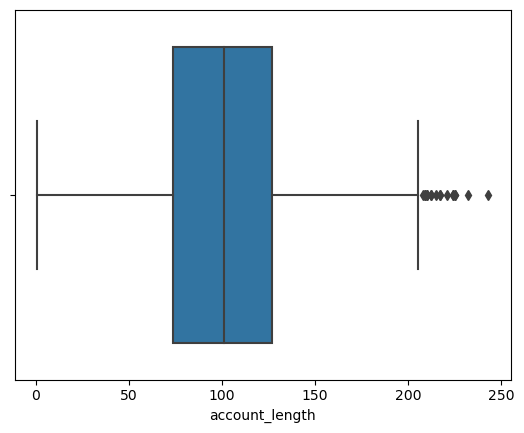


distplot of account_length
----------------------------------------------------------------------------


<Figure size 640x480 with 0 Axes>

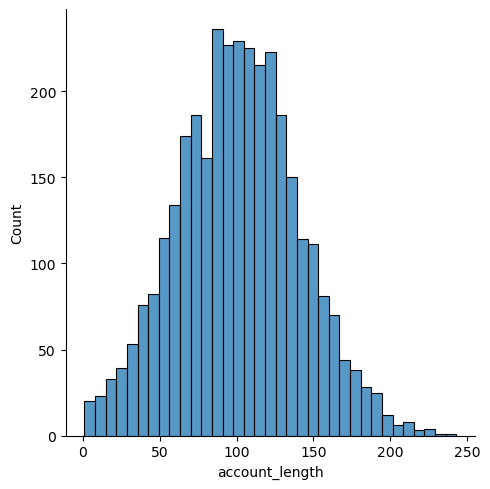


Histogram of account_length
----------------------------------------------------------------------------


<Figure size 640x480 with 0 Axes>

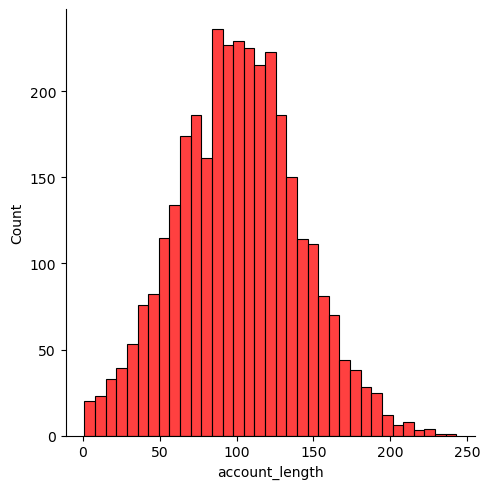


Histogram with mean, median and mode of account_length
----------------------------------------------------------------------------
Mean:  101.06480648064806 
Median:  101.0 
Mode:  105


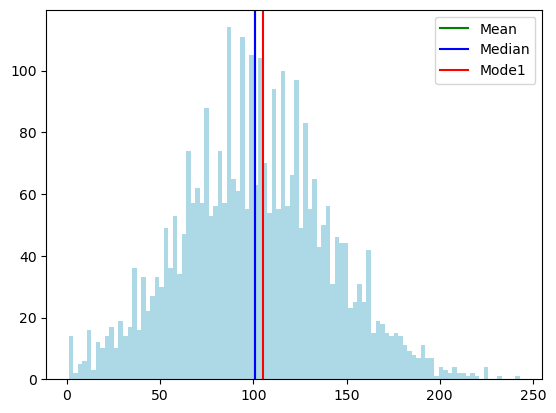


Skewness of account_length
----------------------------------------------------------------------------
0.09660629423135147

This Column is Finished !!
 Let’s start a new one


Description of voice_mail_plan
----------------------------------------------------------------------------
count    3333.000000
mean        0.276628
std         0.447398
min         0.000000
25%         0.000000
50%         0.000000
75%         1.000000
max         1.000000
Name: voice_mail_plan, dtype: float64

Statistical values of voice_mail_plan
----------------------------------------------------------------------------
Minimum :  0
Maximum :  1
Mean value :  0.27662766276627665
Median value :  0.0
Standard deviation :  0.4473978703800777

Null Values of voice_mail_plan
----------------------------------------------------------------------------
Null values :  False
Null values :  0

Quartile of voice_mail_plan
----------------------------------------------------------------------------
1st Quartile (Q1) 

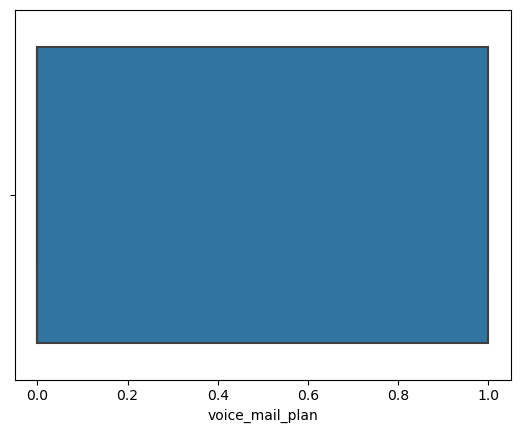


distplot of voice_mail_plan
----------------------------------------------------------------------------


<Figure size 640x480 with 0 Axes>

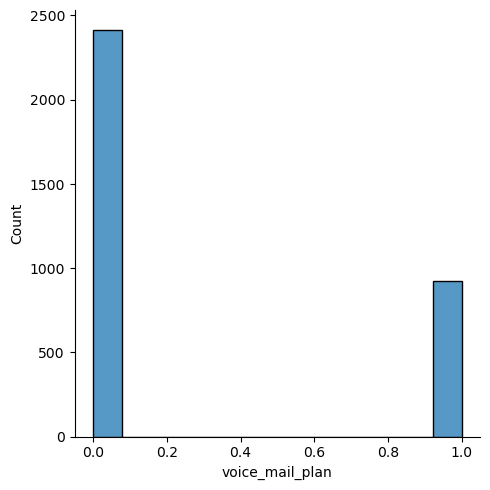


Histogram of voice_mail_plan
----------------------------------------------------------------------------


<Figure size 640x480 with 0 Axes>

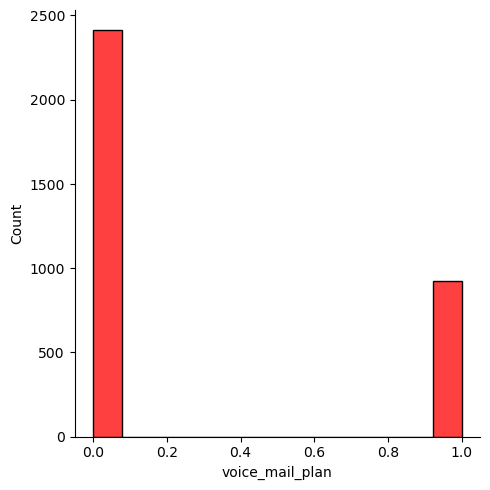


Histogram with mean, median and mode of voice_mail_plan
----------------------------------------------------------------------------
Mean:  0.27662766276627665 
Median:  0.0 
Mode:  0


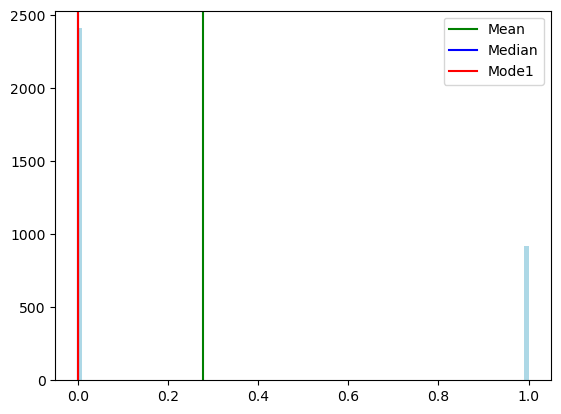


Skewness of voice_mail_plan
----------------------------------------------------------------------------
0.9991395548141272

This Column is Finished !!
 Let’s start a new one


Description of voice_mail_messages
----------------------------------------------------------------------------
count    3333.000000
mean        8.099010
std        13.688365
min         0.000000
25%         0.000000
50%         0.000000
75%        20.000000
max        51.000000
Name: voice_mail_messages, dtype: float64

Statistical values of voice_mail_messages
----------------------------------------------------------------------------
Minimum :  0
Maximum :  51
Mean value :  8.099009900990099
Median value :  0.0
Standard deviation :  13.68836537203884

Null Values of voice_mail_messages
----------------------------------------------------------------------------
Null values :  False
Null values :  0

Quartile of voice_mail_messages
----------------------------------------------------------------------------


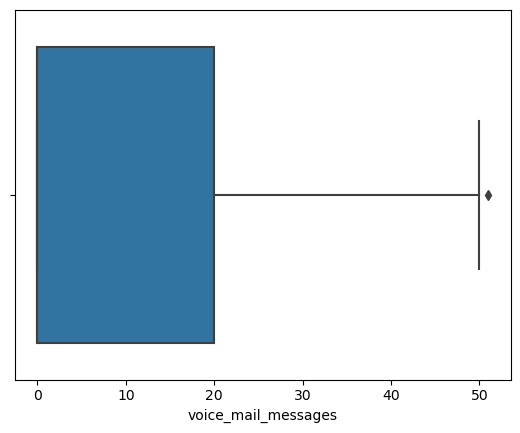


distplot of voice_mail_messages
----------------------------------------------------------------------------


<Figure size 640x480 with 0 Axes>

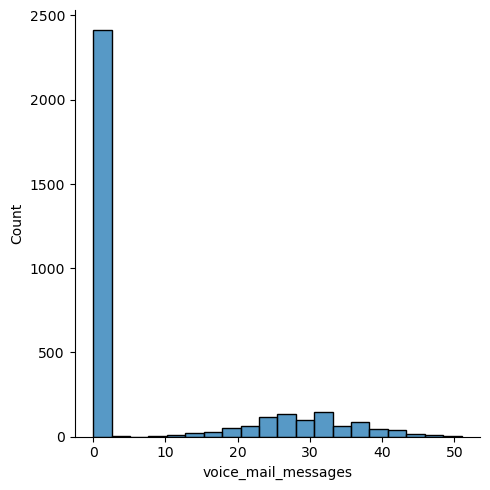


Histogram of voice_mail_messages
----------------------------------------------------------------------------


<Figure size 640x480 with 0 Axes>

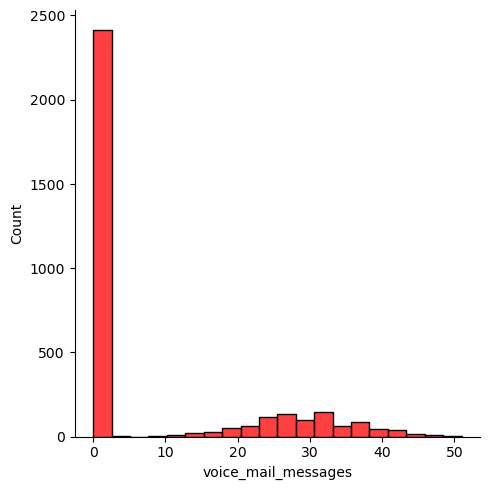


Histogram with mean, median and mode of voice_mail_messages
----------------------------------------------------------------------------
Mean:  8.099009900990099 
Median:  0.0 
Mode:  0


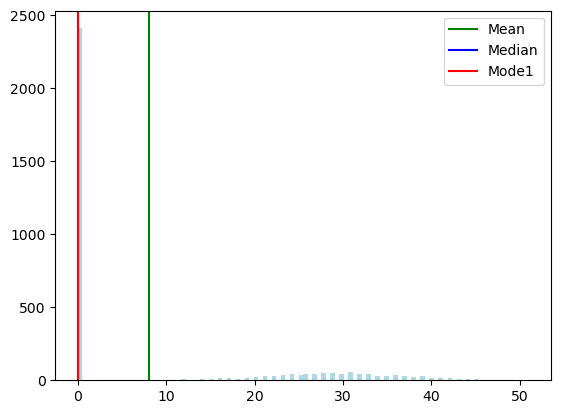


Skewness of voice_mail_messages
----------------------------------------------------------------------------
1.2648236337102594

This Column is Finished !!
 Let’s start a new one


Description of day_mins
----------------------------------------------------------------------------
count    3333.000000
mean      179.775098
std        54.467389
min         0.000000
25%       143.700000
50%       179.400000
75%       216.400000
max       350.800000
Name: day_mins, dtype: float64

Statistical values of day_mins
----------------------------------------------------------------------------
Minimum :  0.0
Maximum :  350.8
Mean value :  179.77509750975116
Median value :  179.4
Standard deviation :  54.46738920237142

Null Values of day_mins
----------------------------------------------------------------------------
Null values :  False
Null values :  0

Quartile of day_mins
----------------------------------------------------------------------------
1st Quartile (Q1) is:  143.7
3st Quartile (

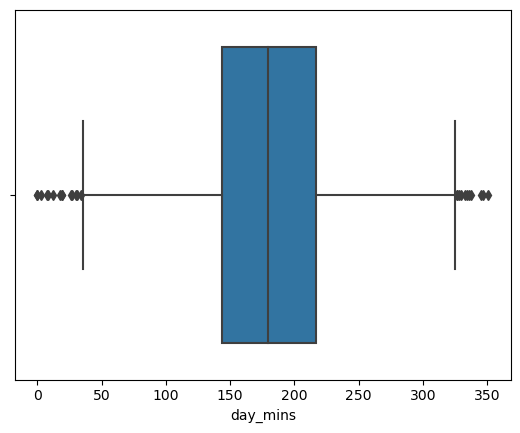


distplot of day_mins
----------------------------------------------------------------------------


<Figure size 640x480 with 0 Axes>

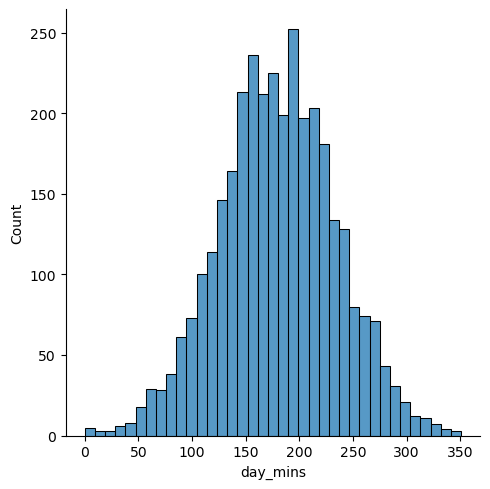


Histogram of day_mins
----------------------------------------------------------------------------


<Figure size 640x480 with 0 Axes>

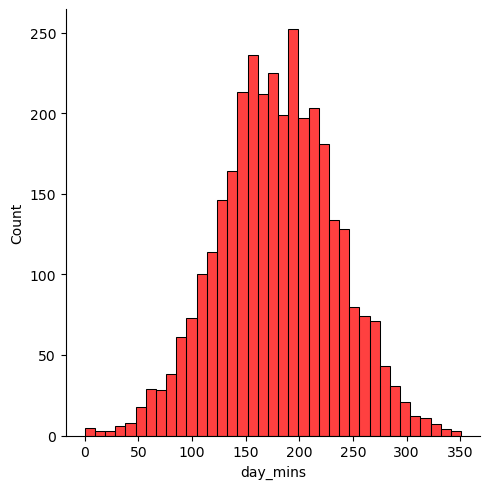


Histogram with mean, median and mode of day_mins
----------------------------------------------------------------------------
Mean:  179.77509750975116 
Median:  179.4 
Mode:  154.0


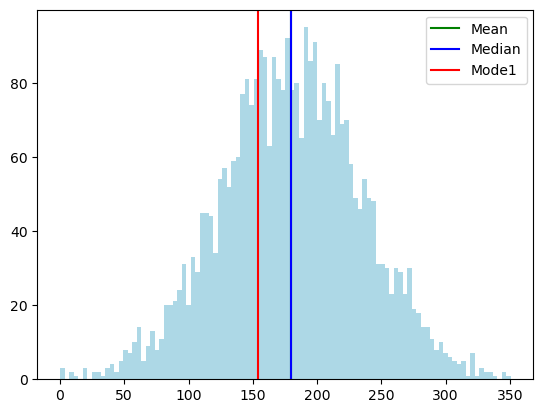


Skewness of day_mins
----------------------------------------------------------------------------
-0.029077067143188955

This Column is Finished !!
 Let’s start a new one


Description of evening_mins
----------------------------------------------------------------------------
count    3333.000000
mean      200.980348
std        50.713844
min         0.000000
25%       166.600000
50%       201.400000
75%       235.300000
max       363.700000
Name: evening_mins, dtype: float64

Statistical values of evening_mins
----------------------------------------------------------------------------
Minimum :  0.0
Maximum :  363.7
Mean value :  200.98034803480346
Median value :  201.4
Standard deviation :  50.71384442581193

Null Values of evening_mins
----------------------------------------------------------------------------
Null values :  False
Null values :  0

Quartile of evening_mins
----------------------------------------------------------------------------
1st Quartile (Q1) is:  166.6
3s

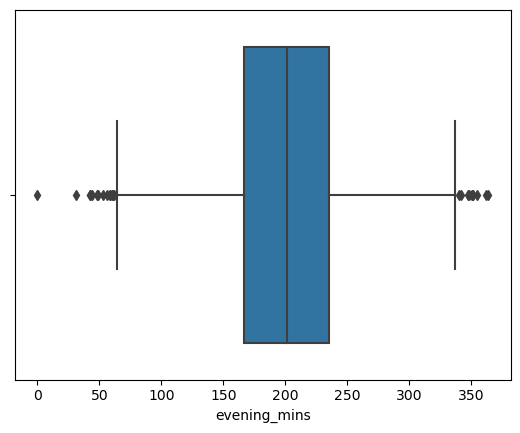


distplot of evening_mins
----------------------------------------------------------------------------


<Figure size 640x480 with 0 Axes>

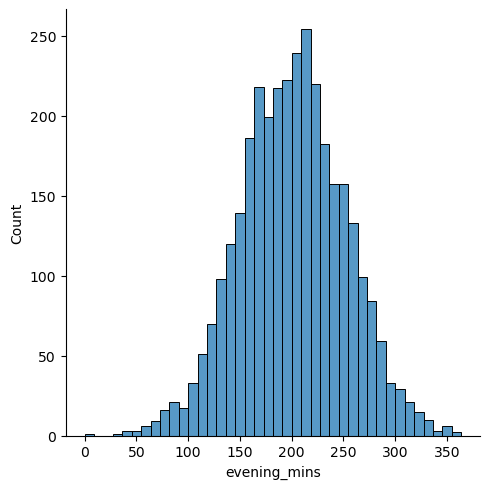


Histogram of evening_mins
----------------------------------------------------------------------------


<Figure size 640x480 with 0 Axes>

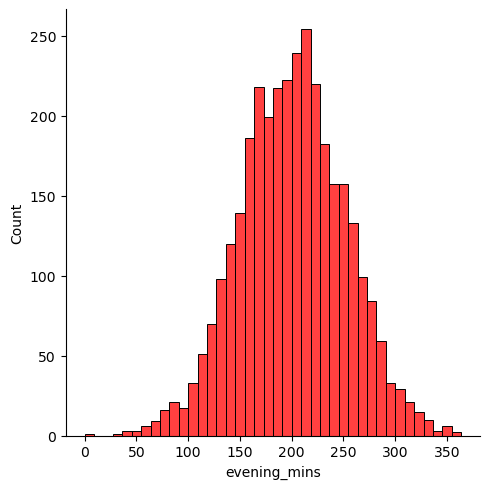


Histogram with mean, median and mode of evening_mins
----------------------------------------------------------------------------
Mean:  200.98034803480346 
Median:  201.4 
Mode:  169.9


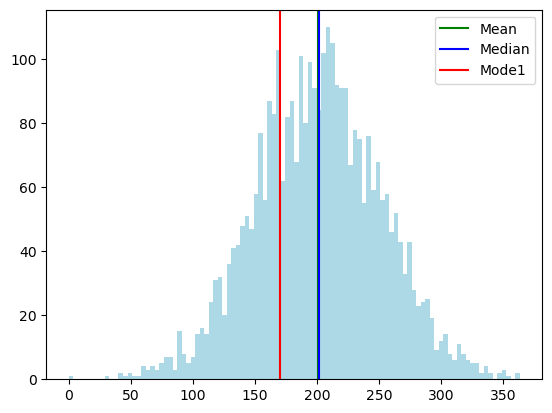


Skewness of evening_mins
----------------------------------------------------------------------------
-0.023877456078123447

This Column is Finished !!
 Let’s start a new one


Description of night_mins
----------------------------------------------------------------------------
count    3333.000000
mean      200.872037
std        50.573847
min        23.200000
25%       167.000000
50%       201.200000
75%       235.300000
max       395.000000
Name: night_mins, dtype: float64

Statistical values of night_mins
----------------------------------------------------------------------------
Minimum :  23.2
Maximum :  395.0
Mean value :  200.87203720372048
Median value :  201.2
Standard deviation :  50.5738470136583

Null Values of night_mins
----------------------------------------------------------------------------
Null values :  False
Null values :  0

Quartile of night_mins
----------------------------------------------------------------------------
1st Quartile (Q1) is:  167.0
3st Quar

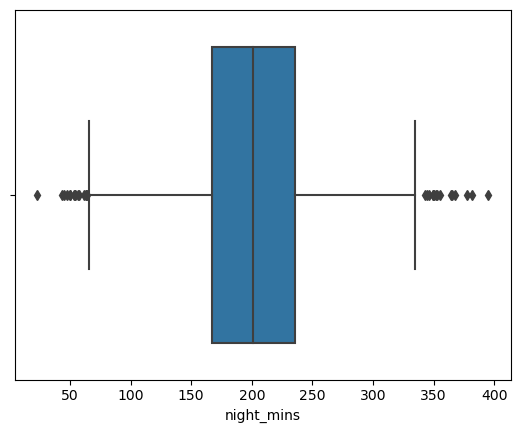


distplot of night_mins
----------------------------------------------------------------------------


<Figure size 640x480 with 0 Axes>

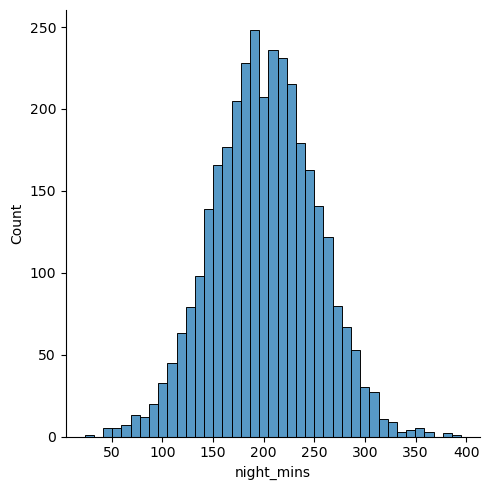


Histogram of night_mins
----------------------------------------------------------------------------


<Figure size 640x480 with 0 Axes>

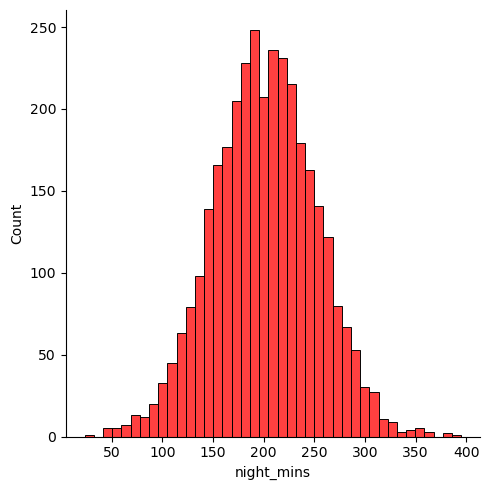


Histogram with mean, median and mode of night_mins
----------------------------------------------------------------------------
Mean:  200.87203720372048 
Median:  201.2 
Mode:  188.2


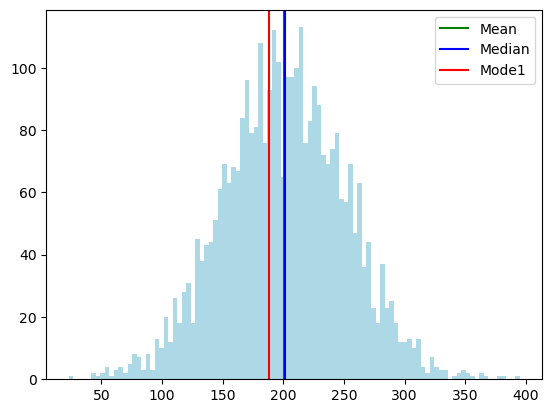


Skewness of night_mins
----------------------------------------------------------------------------
0.008921291065494056

This Column is Finished !!
 Let’s start a new one


Description of international_mins
----------------------------------------------------------------------------
count    3333.000000
mean       10.237294
std         2.791840
min         0.000000
25%         8.500000
50%        10.300000
75%        12.100000
max        20.000000
Name: international_mins, dtype: float64

Statistical values of international_mins
----------------------------------------------------------------------------
Minimum :  0.0
Maximum :  20.0
Mean value :  10.237293729372933
Median value :  10.3
Standard deviation :  2.7918395484084204

Null Values of international_mins
----------------------------------------------------------------------------
Null values :  False
Null values :  0

Quartile of international_mins
----------------------------------------------------------------------------
1

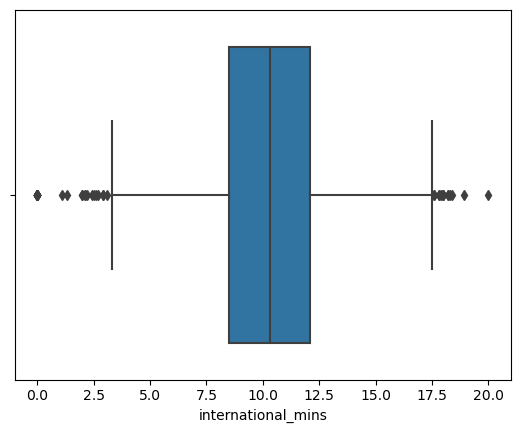


distplot of international_mins
----------------------------------------------------------------------------


<Figure size 640x480 with 0 Axes>

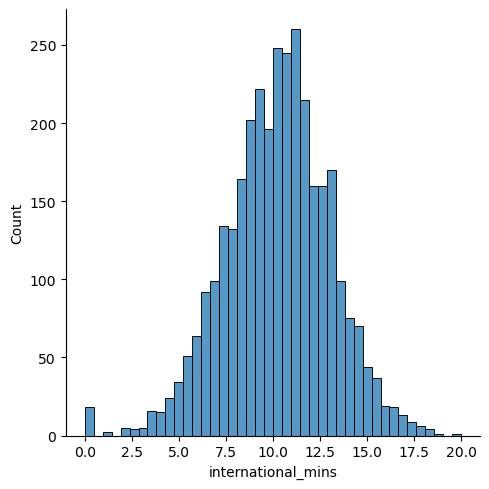


Histogram of international_mins
----------------------------------------------------------------------------


<Figure size 640x480 with 0 Axes>

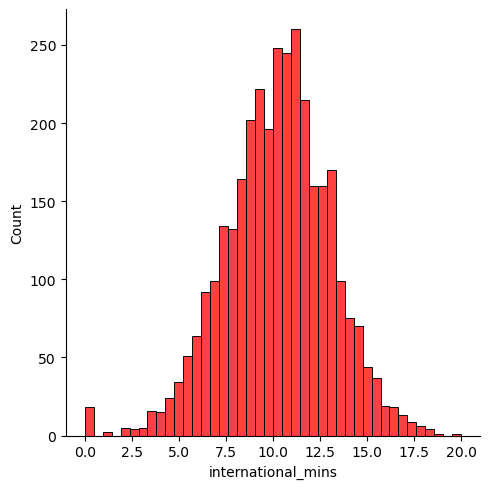


Histogram with mean, median and mode of international_mins
----------------------------------------------------------------------------
Mean:  10.237293729372933 
Median:  10.3 
Mode:  10.0


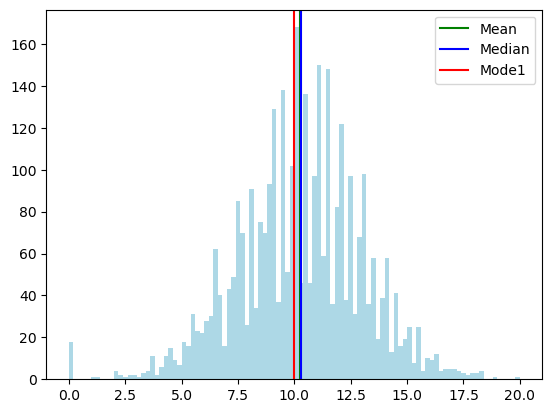


Skewness of international_mins
----------------------------------------------------------------------------
-0.2451359394861856

This Column is Finished !!
 Let’s start a new one


Description of customer_service_calls
----------------------------------------------------------------------------
count    3333.000000
mean        1.562856
std         1.315491
min         0.000000
25%         1.000000
50%         1.000000
75%         2.000000
max         9.000000
Name: customer_service_calls, dtype: float64

Statistical values of customer_service_calls
----------------------------------------------------------------------------
Minimum :  0
Maximum :  9
Mean value :  1.5628562856285628
Median value :  1.0
Standard deviation :  1.3154910448664843

Null Values of customer_service_calls
----------------------------------------------------------------------------
Null values :  False
Null values :  0

Quartile of customer_service_calls
---------------------------------------------------------

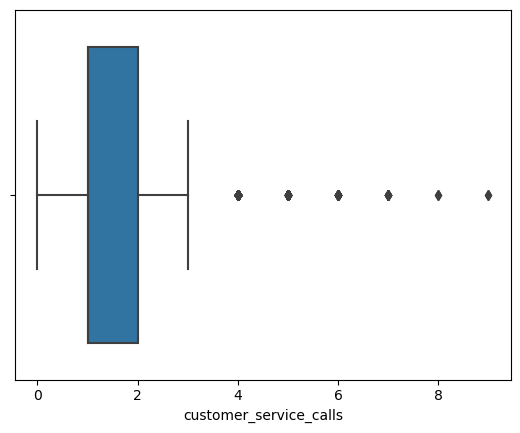


distplot of customer_service_calls
----------------------------------------------------------------------------


<Figure size 640x480 with 0 Axes>

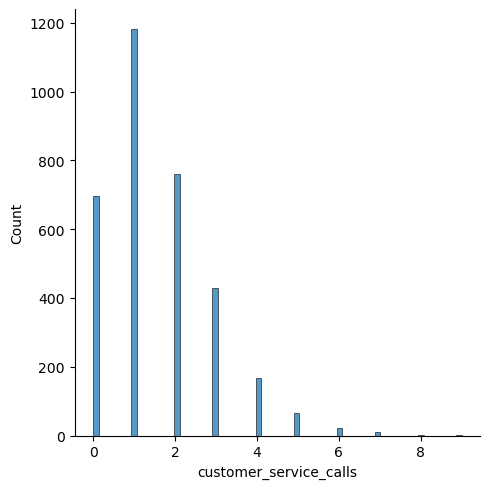


Histogram of customer_service_calls
----------------------------------------------------------------------------


<Figure size 640x480 with 0 Axes>

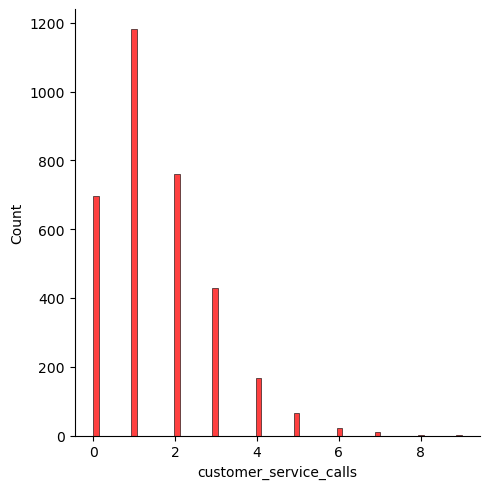


Histogram with mean, median and mode of customer_service_calls
----------------------------------------------------------------------------
Mean:  1.5628562856285628 
Median:  1.0 
Mode:  1


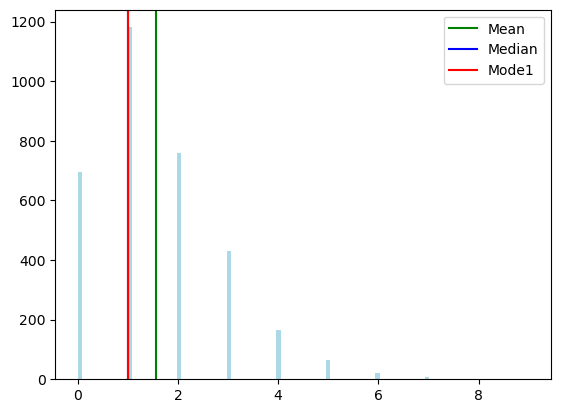


Skewness of customer_service_calls
----------------------------------------------------------------------------
1.0913594824728512

This Column is Finished !!
 Let’s start a new one


Description of international_plan
----------------------------------------------------------------------------
count    3333.000000
mean        0.096910
std         0.295879
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: international_plan, dtype: float64

Statistical values of international_plan
----------------------------------------------------------------------------
Minimum :  0
Maximum :  1
Mean value :  0.0969096909690969
Median value :  0.0
Standard deviation :  0.2958791454844224

Null Values of international_plan
----------------------------------------------------------------------------
Null values :  False
Null values :  0

Quartile of international_plan
--------------------------------------------------------------------------

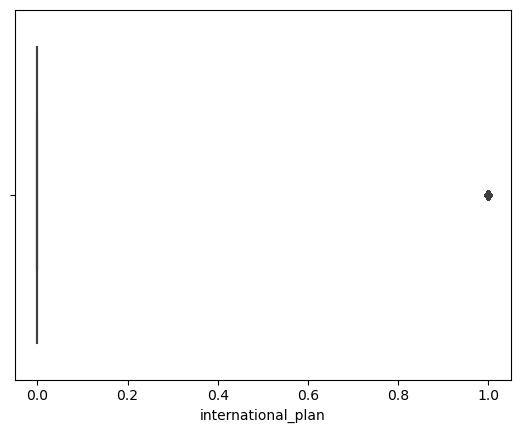


distplot of international_plan
----------------------------------------------------------------------------


<Figure size 640x480 with 0 Axes>

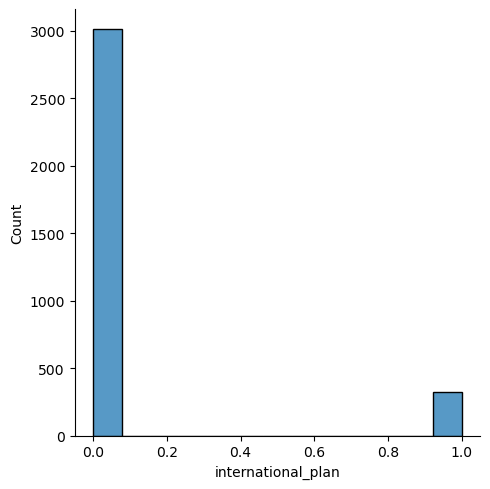


Histogram of international_plan
----------------------------------------------------------------------------


<Figure size 640x480 with 0 Axes>

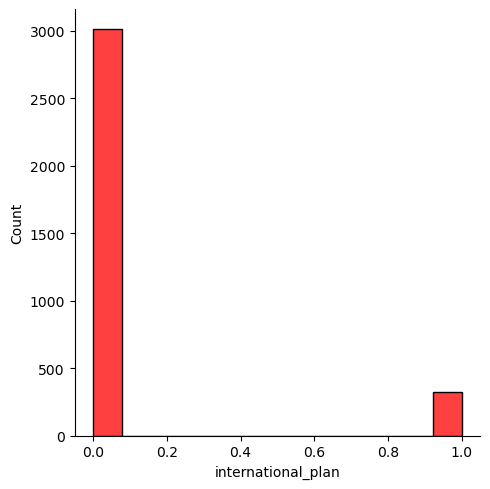


Histogram with mean, median and mode of international_plan
----------------------------------------------------------------------------
Mean:  0.0969096909690969 
Median:  0.0 
Mode:  0


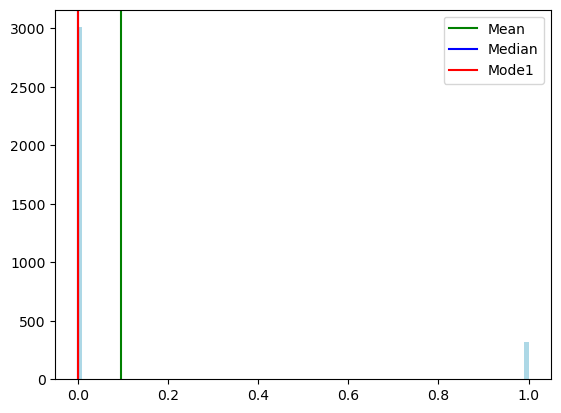


Skewness of international_plan
----------------------------------------------------------------------------
2.7263316038885086

This Column is Finished !!
 Let’s start a new one


Description of day_calls
----------------------------------------------------------------------------
count    3333.000000
mean      100.435644
std        20.069084
min         0.000000
25%        87.000000
50%       101.000000
75%       114.000000
max       165.000000
Name: day_calls, dtype: float64

Statistical values of day_calls
----------------------------------------------------------------------------
Minimum :  0
Maximum :  165
Mean value :  100.43564356435644
Median value :  101.0
Standard deviation :  20.069084207300854

Null Values of day_calls
----------------------------------------------------------------------------
Null values :  False
Null values :  0

Quartile of day_calls
----------------------------------------------------------------------------
1st Quartile (Q1) is:  87.0
3st Quartile (

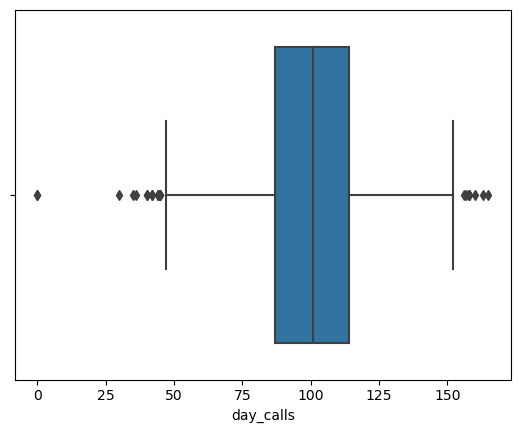


distplot of day_calls
----------------------------------------------------------------------------


<Figure size 640x480 with 0 Axes>

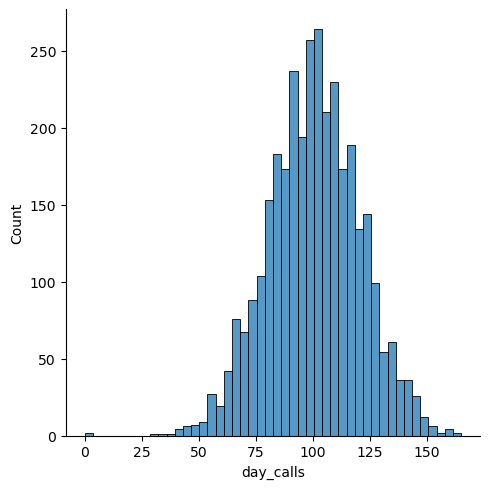


Histogram of day_calls
----------------------------------------------------------------------------


<Figure size 640x480 with 0 Axes>

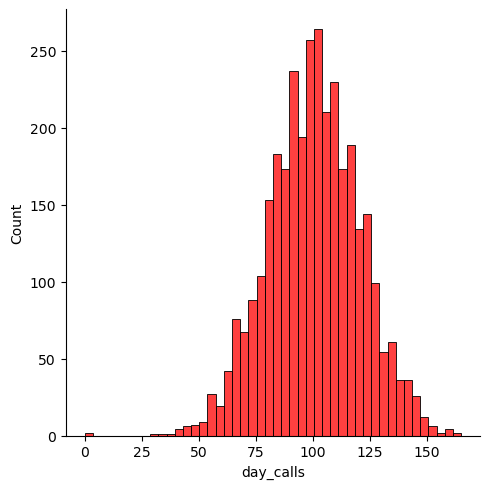


Histogram with mean, median and mode of day_calls
----------------------------------------------------------------------------
Mean:  100.43564356435644 
Median:  101.0 
Mode:  102


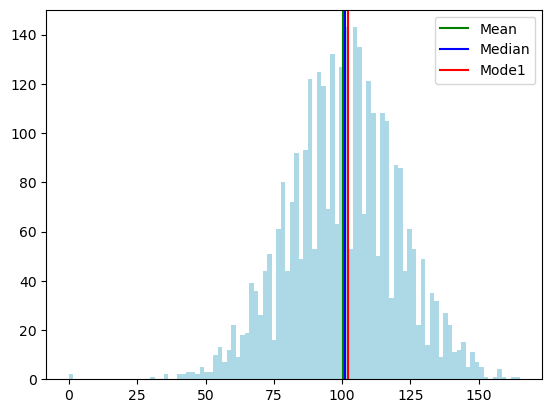


Skewness of day_calls
----------------------------------------------------------------------------
-0.11178663903979906

This Column is Finished !!
 Let’s start a new one


Description of day_charge
----------------------------------------------------------------------------
count    3333.000000
mean       30.562307
std         9.259435
min         0.000000
25%        24.430000
50%        30.500000
75%        36.790000
max        59.640000
Name: day_charge, dtype: float64

Statistical values of day_charge
----------------------------------------------------------------------------
Minimum :  0.0
Maximum :  59.64
Mean value :  30.562307230723093
Median value :  30.5
Standard deviation :  9.259434553930507

Null Values of day_charge
----------------------------------------------------------------------------
Null values :  False
Null values :  0

Quartile of day_charge
----------------------------------------------------------------------------
1st Quartile (Q1) is:  24.43
3st Quartile 

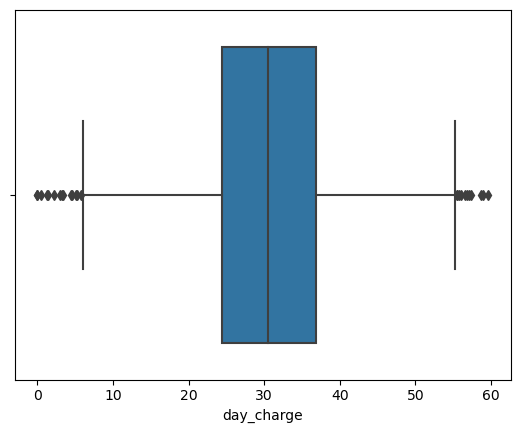


distplot of day_charge
----------------------------------------------------------------------------


<Figure size 640x480 with 0 Axes>

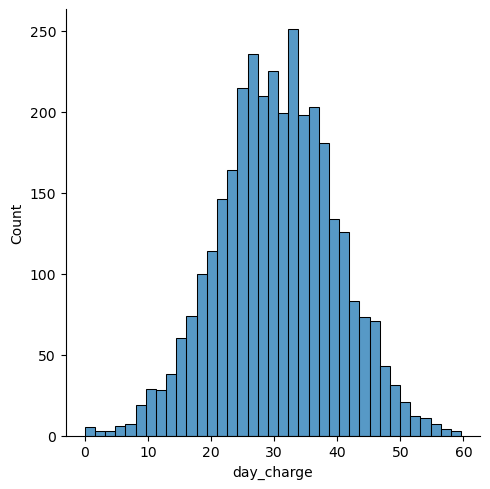


Histogram of day_charge
----------------------------------------------------------------------------


<Figure size 640x480 with 0 Axes>

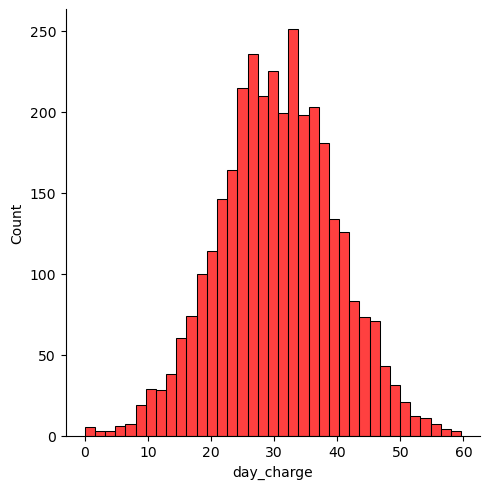


Histogram with mean, median and mode of day_charge
----------------------------------------------------------------------------
Mean:  30.562307230723093 
Median:  30.5 
Mode:  26.18


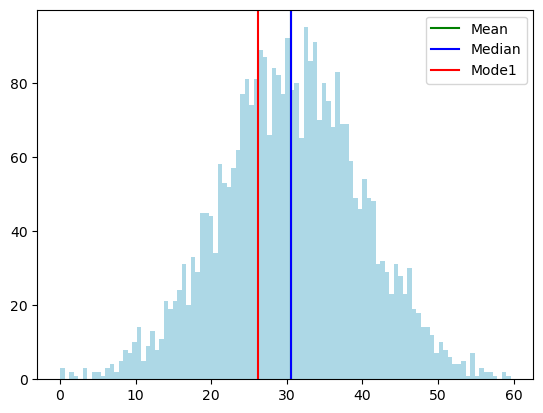


Skewness of day_charge
----------------------------------------------------------------------------
-0.029083268343274994

This Column is Finished !!
 Let’s start a new one


Description of evening_calls
----------------------------------------------------------------------------
count    3333.000000
mean      100.114311
std        19.922625
min         0.000000
25%        87.000000
50%       100.000000
75%       114.000000
max       170.000000
Name: evening_calls, dtype: float64

Statistical values of evening_calls
----------------------------------------------------------------------------
Minimum :  0
Maximum :  170
Mean value :  100.11431143114311
Median value :  100.0
Standard deviation :  19.92262529394309

Null Values of evening_calls
----------------------------------------------------------------------------
Null values :  False
Null values :  0

Quartile of evening_calls
----------------------------------------------------------------------------
1st Quartile (Q1) is:  87.0


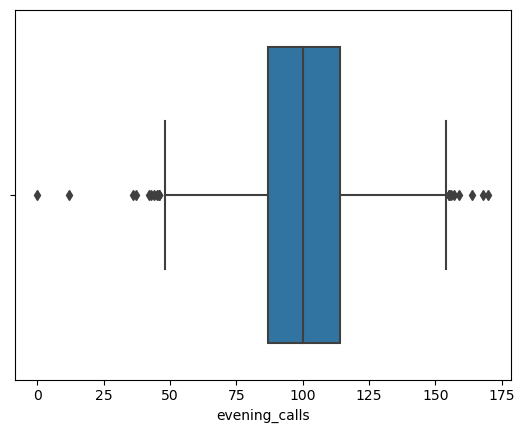


distplot of evening_calls
----------------------------------------------------------------------------


<Figure size 640x480 with 0 Axes>

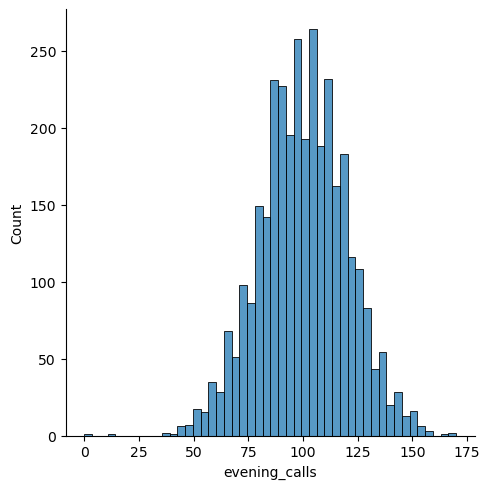


Histogram of evening_calls
----------------------------------------------------------------------------


<Figure size 640x480 with 0 Axes>

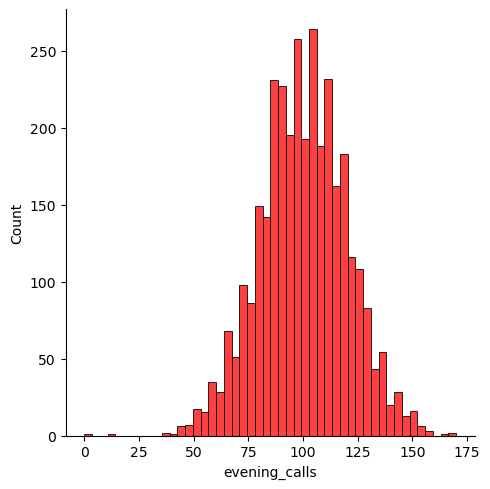


Histogram with mean, median and mode of evening_calls
----------------------------------------------------------------------------
Mean:  100.11431143114311 
Median:  100.0 
Mode:  105


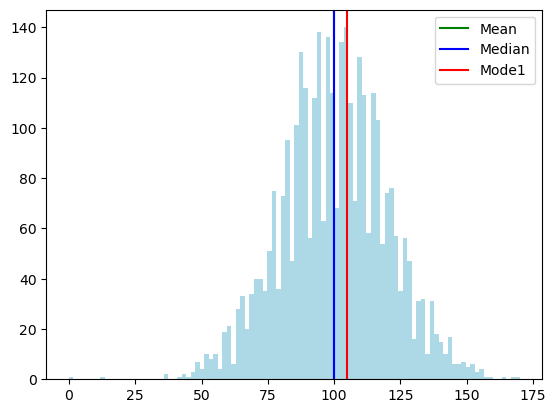


Skewness of evening_calls
----------------------------------------------------------------------------
-0.05556313904148763

This Column is Finished !!
 Let’s start a new one


Description of evening_charge
----------------------------------------------------------------------------
count    3333.000000
mean       17.083540
std         4.310668
min         0.000000
25%        14.160000
50%        17.120000
75%        20.000000
max        30.910000
Name: evening_charge, dtype: float64

Statistical values of evening_charge
----------------------------------------------------------------------------
Minimum :  0.0
Maximum :  30.91
Mean value :  17.083540354035392
Median value :  17.12
Standard deviation :  4.310667643110339

Null Values of evening_charge
----------------------------------------------------------------------------
Null values :  False
Null values :  0

Quartile of evening_charge
----------------------------------------------------------------------------
1st Quartile (Q1)

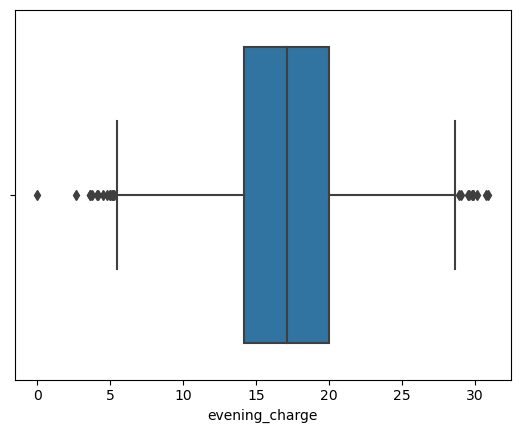


distplot of evening_charge
----------------------------------------------------------------------------


<Figure size 640x480 with 0 Axes>

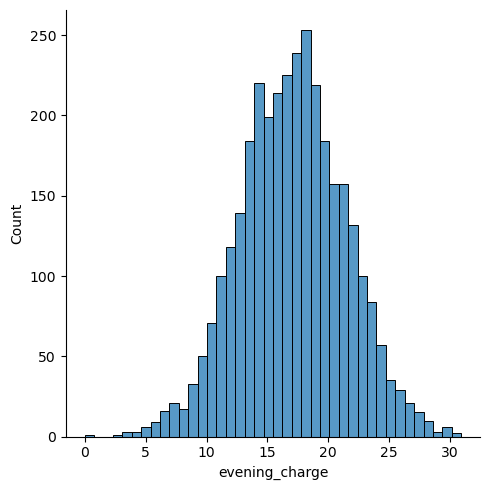


Histogram of evening_charge
----------------------------------------------------------------------------


<Figure size 640x480 with 0 Axes>

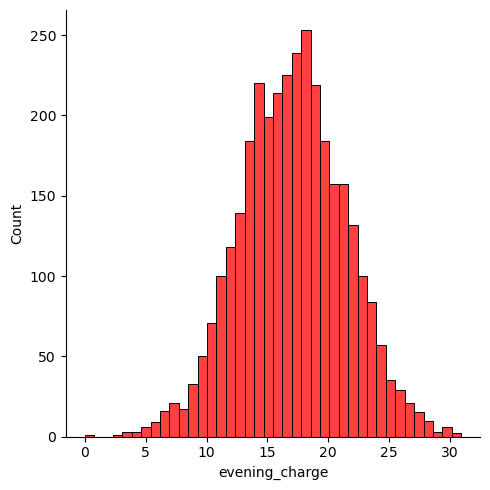


Histogram with mean, median and mode of evening_charge
----------------------------------------------------------------------------
Mean:  17.083540354035392 
Median:  17.12 
Mode:  14.25


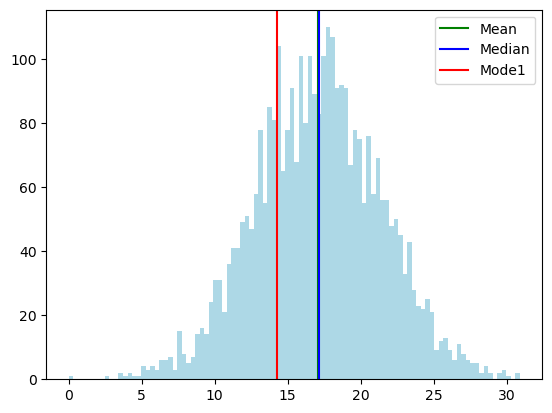


Skewness of evening_charge
----------------------------------------------------------------------------
-0.02385798900760956

This Column is Finished !!
 Let’s start a new one


Description of night_calls
----------------------------------------------------------------------------
count    3333.000000
mean      100.107711
std        19.568609
min        33.000000
25%        87.000000
50%       100.000000
75%       113.000000
max       175.000000
Name: night_calls, dtype: float64

Statistical values of night_calls
----------------------------------------------------------------------------
Minimum :  33
Maximum :  175
Mean value :  100.10771077107711
Median value :  100.0
Standard deviation :  19.568609346058615

Null Values of night_calls
----------------------------------------------------------------------------
Null values :  False
Null values :  0

Quartile of night_calls
----------------------------------------------------------------------------
1st Quartile (Q1) is:  87.0
3st Q

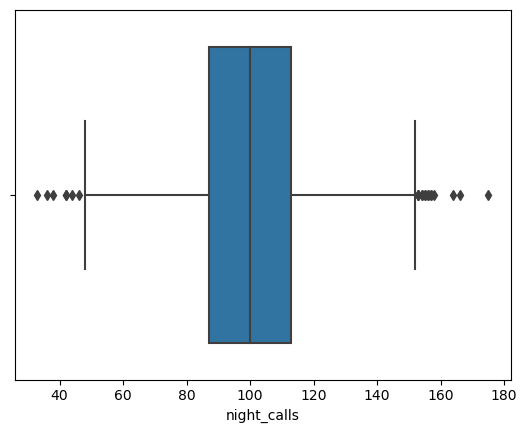


distplot of night_calls
----------------------------------------------------------------------------


<Figure size 640x480 with 0 Axes>

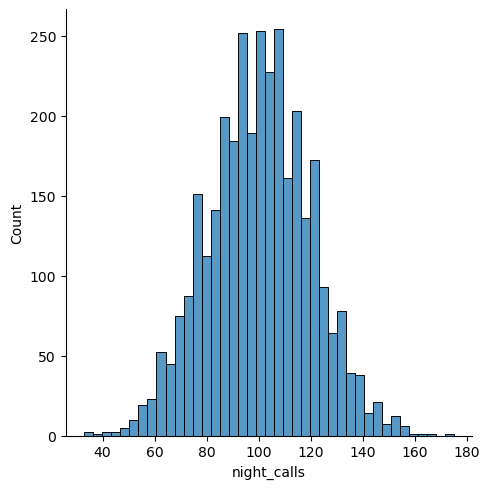


Histogram of night_calls
----------------------------------------------------------------------------


<Figure size 640x480 with 0 Axes>

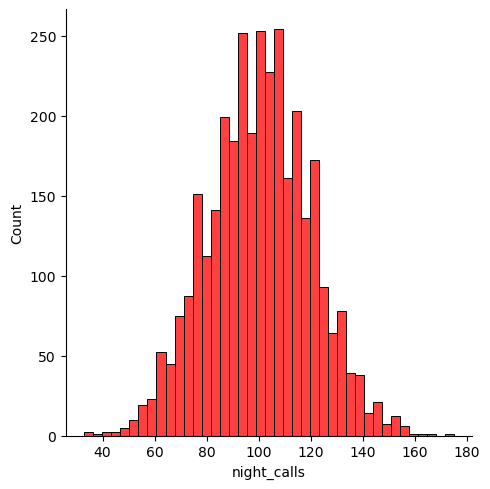


Histogram with mean, median and mode of night_calls
----------------------------------------------------------------------------
Mean:  100.10771077107711 
Median:  100.0 
Mode:  105


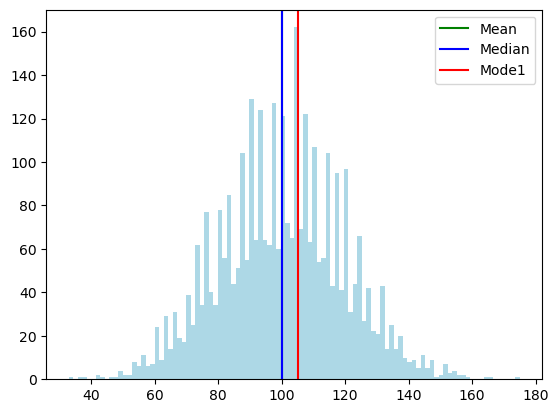


Skewness of night_calls
----------------------------------------------------------------------------
0.03249957015209059

This Column is Finished !!
 Let’s start a new one


Description of night_charge
----------------------------------------------------------------------------
count    3333.000000
mean        9.039325
std         2.275873
min         1.040000
25%         7.520000
50%         9.050000
75%        10.590000
max        17.770000
Name: night_charge, dtype: float64

Statistical values of night_charge
----------------------------------------------------------------------------
Minimum :  1.04
Maximum :  17.77
Mean value :  9.039324932493264
Median value :  9.05
Standard deviation :  2.2758728376600317

Null Values of night_charge
----------------------------------------------------------------------------
Null values :  False
Null values :  0

Quartile of night_charge
----------------------------------------------------------------------------
1st Quartile (Q1) is:  7.52
3s

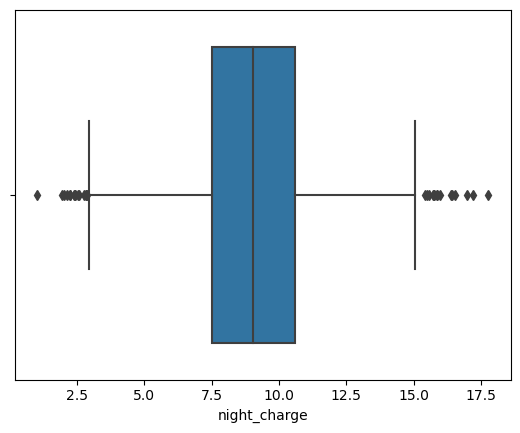


distplot of night_charge
----------------------------------------------------------------------------


<Figure size 640x480 with 0 Axes>

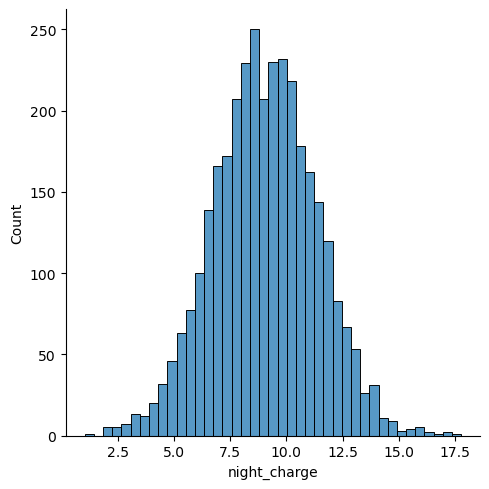


Histogram of night_charge
----------------------------------------------------------------------------


<Figure size 640x480 with 0 Axes>

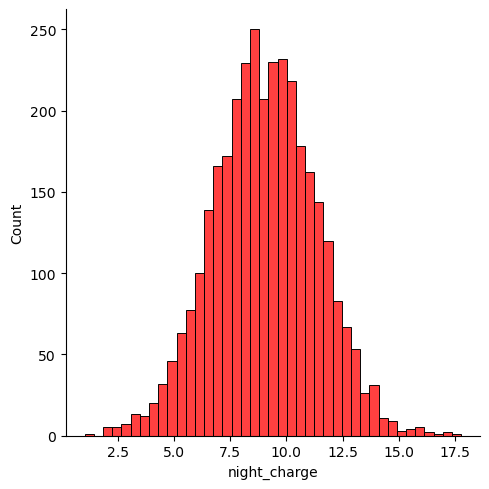


Histogram with mean, median and mode of night_charge
----------------------------------------------------------------------------
Mean:  9.039324932493264 
Median:  9.05 
Mode:  9.45


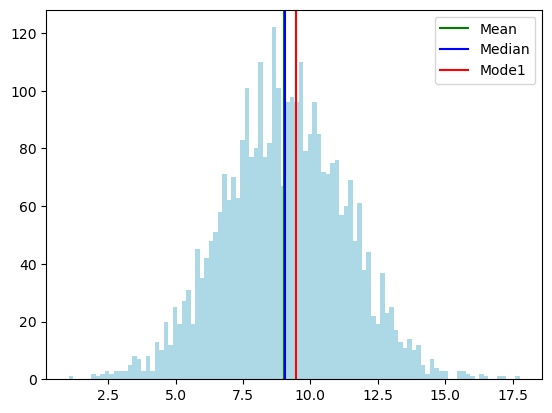


Skewness of night_charge
----------------------------------------------------------------------------
0.008886236769217034

This Column is Finished !!
 Let’s start a new one


Description of international_calls
----------------------------------------------------------------------------
count    3333.000000
mean        4.479448
std         2.461214
min         0.000000
25%         3.000000
50%         4.000000
75%         6.000000
max        20.000000
Name: international_calls, dtype: float64

Statistical values of international_calls
----------------------------------------------------------------------------
Minimum :  0
Maximum :  20
Mean value :  4.4794479447944795
Median value :  4.0
Standard deviation :  2.4612142705460887

Null Values of international_calls
----------------------------------------------------------------------------
Null values :  False
Null values :  0

Quartile of international_calls
----------------------------------------------------------------------------

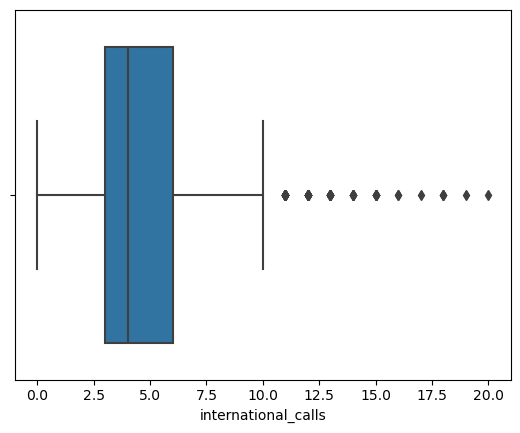


distplot of international_calls
----------------------------------------------------------------------------


<Figure size 640x480 with 0 Axes>

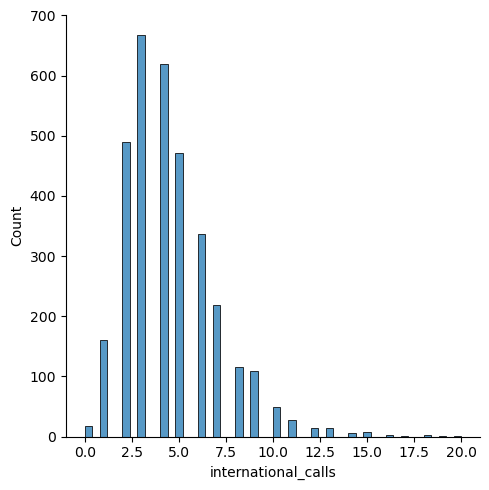


Histogram of international_calls
----------------------------------------------------------------------------


<Figure size 640x480 with 0 Axes>

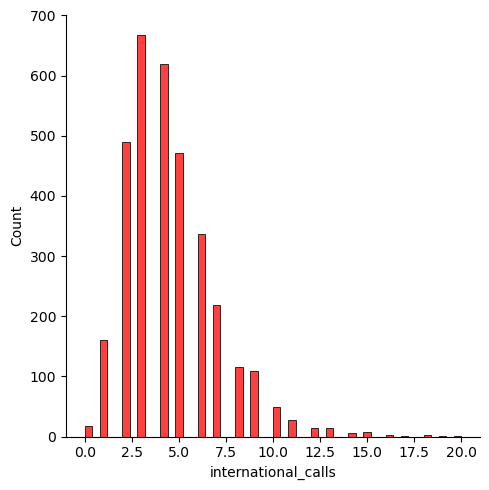


Histogram with mean, median and mode of international_calls
----------------------------------------------------------------------------
Mean:  4.4794479447944795 
Median:  4.0 
Mode:  3


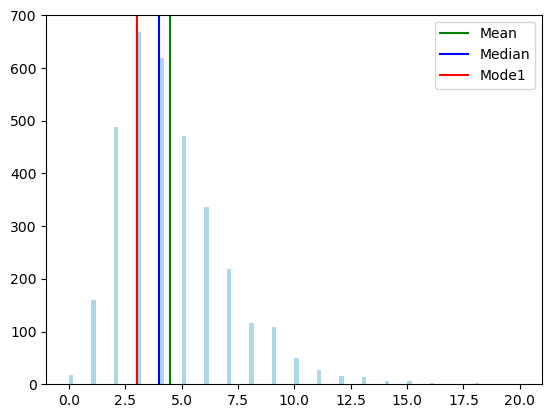


Skewness of international_calls
----------------------------------------------------------------------------
1.3214781658271222

This Column is Finished !!
 Let’s start a new one


Description of international_charge
----------------------------------------------------------------------------
count    3333.000000
mean        2.764581
std         0.753773
min         0.000000
25%         2.300000
50%         2.780000
75%         3.270000
max         5.400000
Name: international_charge, dtype: float64

Statistical values of international_charge
----------------------------------------------------------------------------
Minimum :  0.0
Maximum :  5.4
Mean value :  2.764581458145804
Median value :  2.78
Standard deviation :  0.7537726126630453

Null Values of international_charge
----------------------------------------------------------------------------
Null values :  False
Null values :  0

Quartile of international_charge
---------------------------------------------------------------

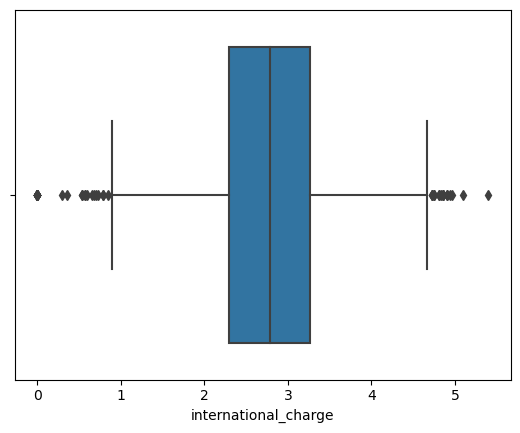


distplot of international_charge
----------------------------------------------------------------------------


<Figure size 640x480 with 0 Axes>

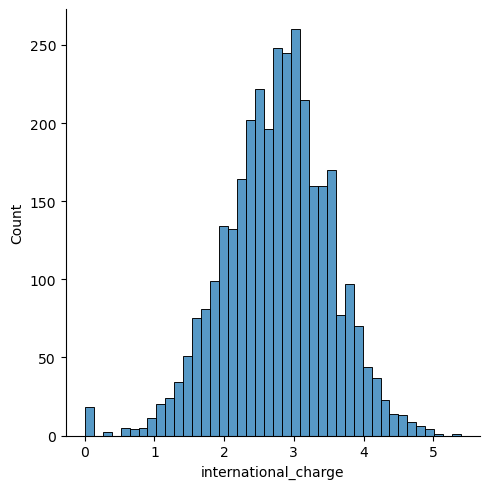


Histogram of international_charge
----------------------------------------------------------------------------


<Figure size 640x480 with 0 Axes>

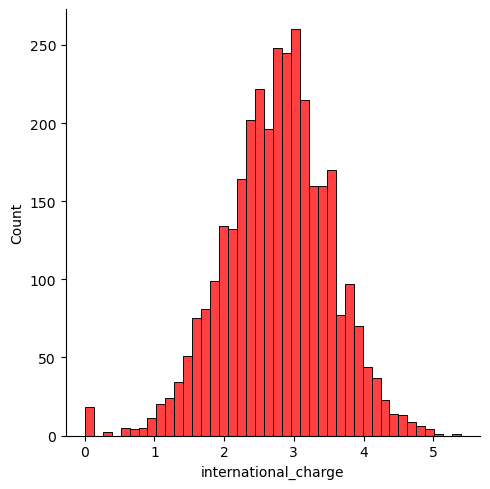


Histogram with mean, median and mode of international_charge
----------------------------------------------------------------------------
Mean:  2.764581458145804 
Median:  2.78 
Mode:  2.7


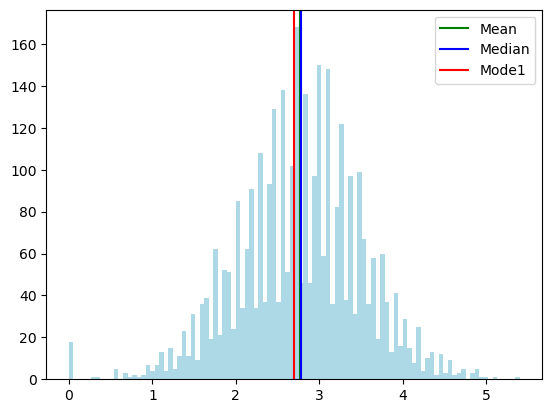


Skewness of international_charge
----------------------------------------------------------------------------
-0.24528650827172838

This Column is Finished !!
 Let’s start a new one


Description of total_charge
----------------------------------------------------------------------------
count    3333.000000
mean       59.449754
std        10.502261
min        22.930000
25%        52.380000
50%        59.470000
75%        66.480000
max        96.150000
Name: total_charge, dtype: float64

Statistical values of total_charge
----------------------------------------------------------------------------
Minimum :  22.93
Maximum :  96.15
Mean value :  59.44975397539747
Median value :  59.47
Standard deviation :  10.50226075242101

Null Values of total_charge
----------------------------------------------------------------------------
Null values :  False
Null values :  0

Quartile of total_charge
----------------------------------------------------------------------------
1st Quartile (Q1) i

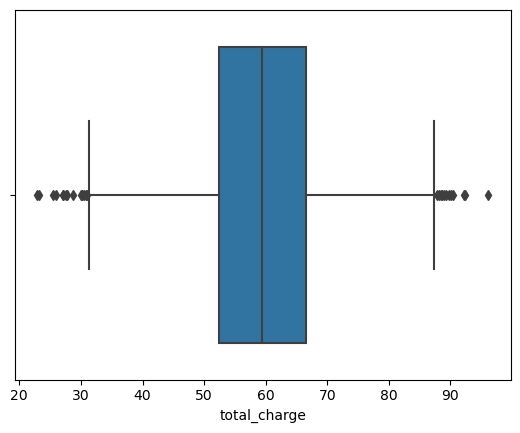


distplot of total_charge
----------------------------------------------------------------------------


<Figure size 640x480 with 0 Axes>

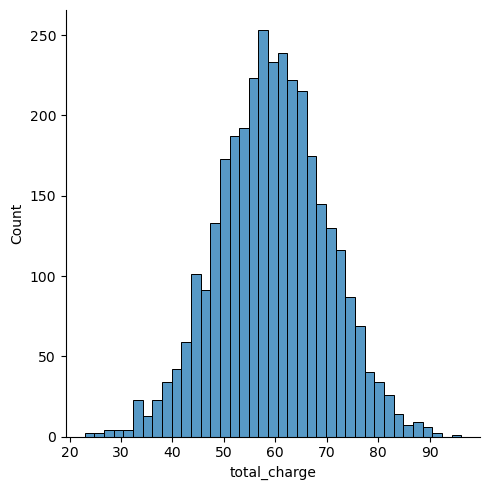


Histogram of total_charge
----------------------------------------------------------------------------


<Figure size 640x480 with 0 Axes>

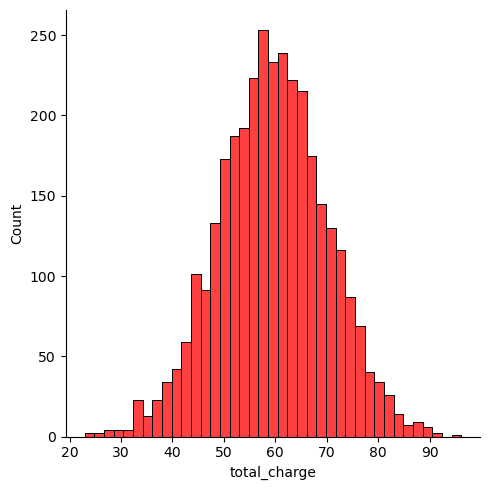


Histogram with mean, median and mode of total_charge
----------------------------------------------------------------------------
Mean:  59.44975397539747 
Median:  59.47 
Mode:  55.05


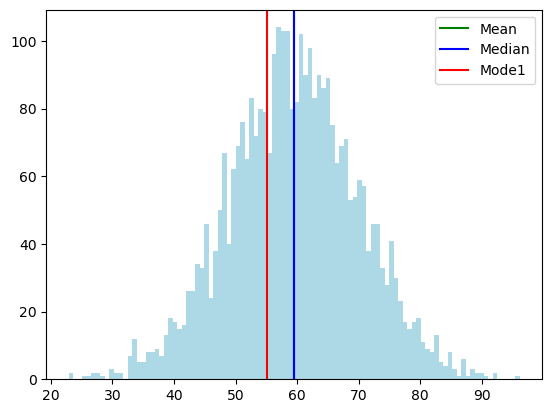


Skewness of total_charge
----------------------------------------------------------------------------
-0.034791327372631416

This Column is Finished !!
 Let’s start a new one


Description of churn
----------------------------------------------------------------------------
count    3333.000000
mean        0.144914
std         0.352067
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: churn, dtype: float64

Statistical values of churn
----------------------------------------------------------------------------
Minimum :  0
Maximum :  1
Mean value :  0.14491449144914492
Median value :  0.0
Standard deviation :  0.35206742362412946

Null Values of churn
----------------------------------------------------------------------------
Null values :  False
Null values :  0

Quartile of churn
----------------------------------------------------------------------------
1st Quartile (Q1) is:  0.0
3st Quartile (Q3) is:  0.0
Interquartile

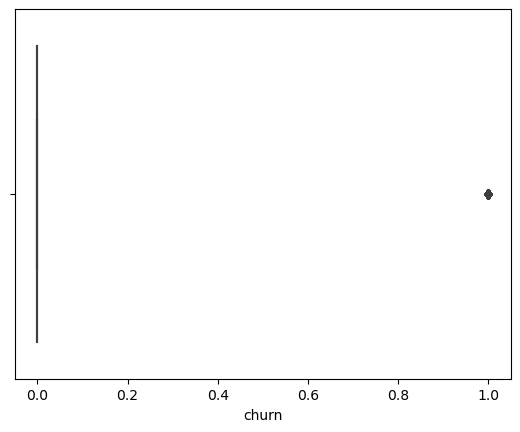


distplot of churn
----------------------------------------------------------------------------


<Figure size 640x480 with 0 Axes>

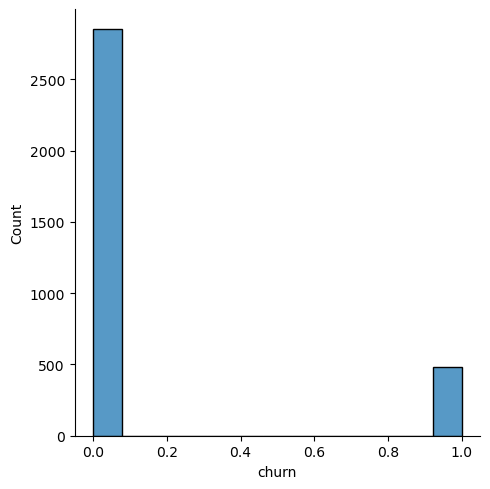


Histogram of churn
----------------------------------------------------------------------------


<Figure size 640x480 with 0 Axes>

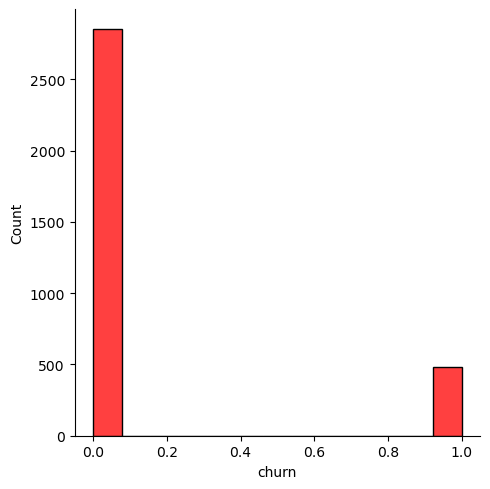


Histogram with mean, median and mode of churn
----------------------------------------------------------------------------
Mean:  0.14491449144914492 
Median:  0.0 
Mode:  0


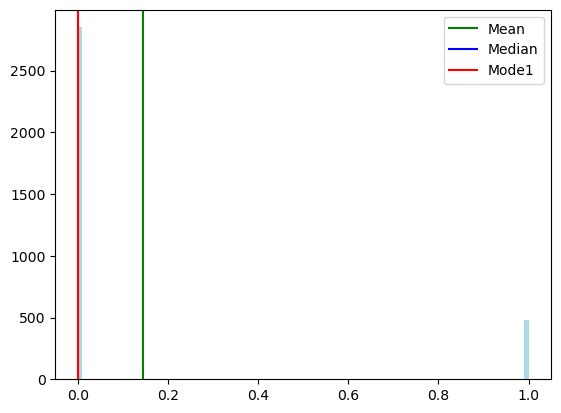


Skewness of churn
----------------------------------------------------------------------------
2.0183560605464663

This Column is Finished !!
 Let’s start a new one



In [10]:
def AutomatedDataAnalysis(column):

    print("\nDescription of " + column)
    print("----------------------------------------------------------------------------")
    print(data[column].describe())

    print("\nStatistical values of " + column)
    print("----------------------------------------------------------------------------")
    # Central values
    print('Minimum : ', data[column].min())
    print('Maximum : ', data[column].max())
    print('Mean value : ', data[column].mean())
    print('Median value : ', data[column].median())
    print('Standard deviation : ', data[column].std())

    print('\nNull Values of ' + column)
    print("----------------------------------------------------------------------------")
    print('Null values : ', data[column].isnull().any())
    print('Null values : ', data[column].isnull().sum().sum())


    print("\nQuartile of " + column)
    print("----------------------------------------------------------------------------")
    # Quartiles
    Q1 = data[column].quantile(q=0.25)
    Q3 = data[column].quantile(q=0.75)
    print('1st Quartile (Q1) is: ', Q1)
    print('3st Quartile (Q3) is: ', Q3)
    print('Interquartile range (IQR) is ', Q3-Q1)

    print("\nOutlier detection from Interquartile range (IQR) " + column)
    print("----------------------------------------------------------------------------")
    L_outliers = Q1 - 1.5 * (Q3 - Q1)
    U_outliers = Q3 + 1.5 * (Q3 - Q1)
    print('Lower outliers range: ', L_outliers)
    print('Upper outliers range: ', U_outliers)
    print('Number of outliers in upper : ', data[data[column] > U_outliers][column].count())
    print('Number of outliers in lower : ', data[data[column] < L_outliers][column].count())
    print('% of Outlier in upper: ', round(data[data[column] > U_outliers][column].count() * 100 / len(data)), '%')
    print('% of Outlier in lower: ', round(data[data[column] < L_outliers][column].count() * 100 / len(data)), '%')

    # boxplot
    plt.figure()
    print("\nBoxPlot of " + column)
    print("----------------------------------------------------------------------------")
    ax = sns.boxplot(x=data[column])
    plt.show()

    # distplot
    plt.figure()
    print("\ndistplot of " + column)
    print("----------------------------------------------------------------------------")
    sns.displot(data[column])
    plt.show()

    # histogram
    plt.figure()
    print("\nHistogram of " + column)
    print("----------------------------------------------------------------------------")
    sns.displot(data[column], kde=False, color='red')
    plt.show()

    # Plotting mean, median and mode
    plt.figure()
    print("\nHistogram with mean, median and mode of " + column)
    print("----------------------------------------------------------------------------")
    mean = data[column].mean()
    median = data[column].median()
    mode = data[column].mode()

    print('Mean: ', mean, '\nMedian: ', median, '\nMode: ', mode[0])
    plt.hist(data[column], bins=100, color='lightblue')  # Plot the histogram
    plt.axvline(mean, color='green',
                label='Mean')  # Draw lines on the plot for mean median and the two modes we have in GRE Score
    plt.axvline(median, color='blue', label='Median')
    plt.axvline(mode[0], color='red', label='Mode1')
    plt.legend()  # Plot the legend
    plt.show()

    print("\nSkewness of " + column)
    print("----------------------------------------------------------------------------")

    print(data[column].skew())

    print('\nThis Column is Finished !!\n Let’s start a new one\n')


data = df1.select_dtypes(include=['float64', 'int64'])
lstnumericcolumns = list(data.columns.values)
print('The Number of Numerical Columns: ', len(lstnumericcolumns))

for x in lstnumericcolumns:
    AutomatedDataAnalysis(x)

# to check the outlier

<AxesSubplot:>

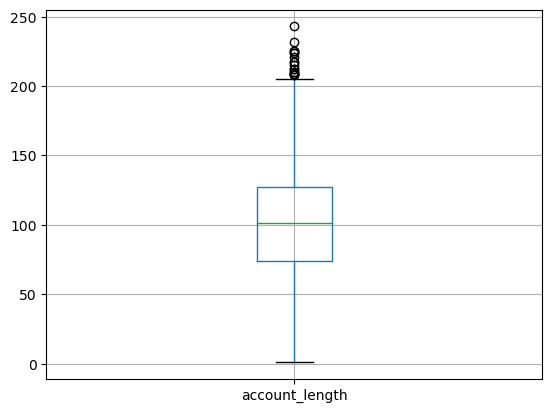

In [11]:
# to check the outlier in this col.(account_length,day_mins,evening_mins,night_mins,day_calls,evening_calls,international_calls)
df1.boxplot('account_length')

<AxesSubplot:>

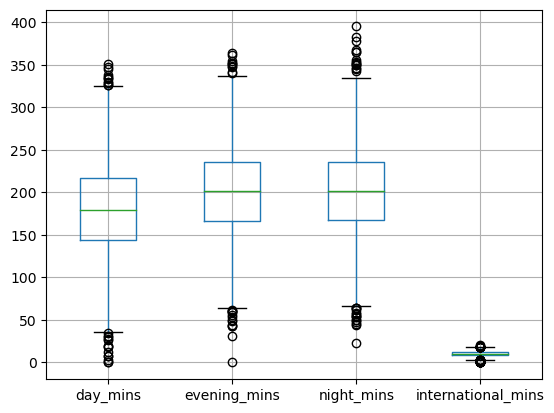

In [12]:
# To check outlier by using baxplot
mins=df1.boxplot(column=['day_mins','evening_mins','night_mins','international_mins'])
mins

this graph shows the there is an outlier in mins col.

<AxesSubplot:>

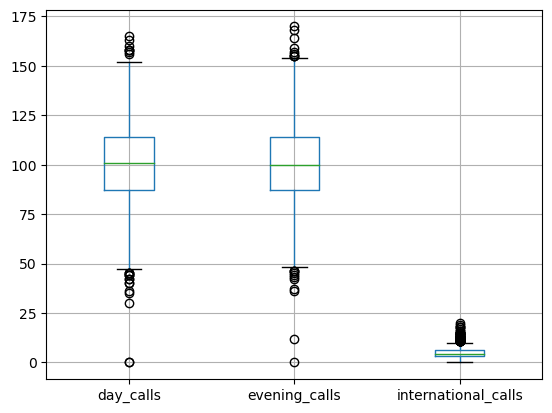

In [13]:
calls=df1.boxplot(column=['day_calls','evening_calls','international_calls'])
calls

this graph shows the outlier is in calls col also

In [14]:
max_thresold,min_thresold=df1['day_mins'].quantile([0.05,0.95])
max_thresold,min_thresold

(89.92, 270.73999999999995)

In [15]:
df2=df1[(df1['day_mins']>max_thresold) & (df1['day_mins']<min_thresold)]
df2.shape

(2999, 19)

<AxesSubplot:>

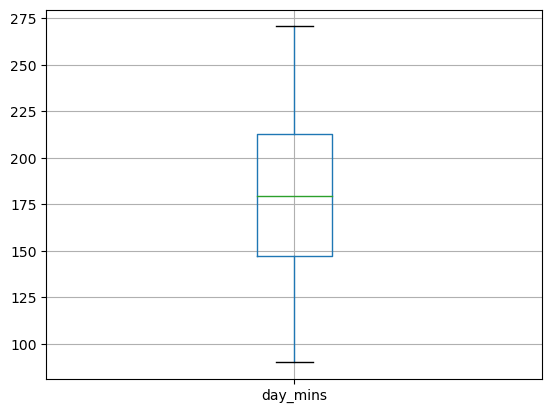

In [16]:
df2.boxplot('day_mins')

In [17]:
cols=['day_mins','evening_mins','night_mins','international_mins','day_calls','evening_calls','international_calls']
q1=df1[cols].quantile(0.25)
q3=df1[cols].quantile(0.75)
IQR= q3-q1 # inter quartile range
df=df1[~((df1[cols]<(q1-1.5*IQR))|(df1[cols]>(q3+1.5*IQR))).any(axis=1)]
df.shape

(3092, 19)

<AxesSubplot:>

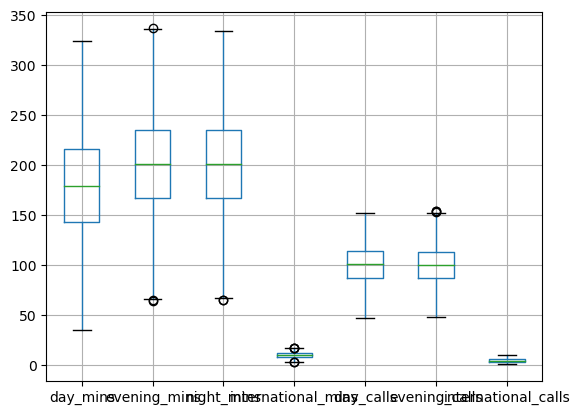

In [18]:
df.boxplot(column=['day_mins','evening_mins','night_mins','international_mins','day_calls','evening_calls','international_calls'])

in this graph we will remove the outerlier of datasets

In [19]:
corr_matrix=df.corr()
corr_matrix

,account_length,voice_mail_plan,voice_mail_messages,day_mins,evening_mins,night_mins,international_mins,customer_service_calls,international_plan,day_calls,day_charge,evening_calls,evening_charge,night_calls,night_charge,international_calls,international_charge,total_charge,churn
account_length,1.000000,0.007845,0.001789,-0.000664,-0.011324,-0.006878,0.017127,-0.001861,0.026997,0.045736,-0.000666,0.012233,-0.011312,-0.011315,-0.006885,0.028775,0.017169,-0.005525,0.012827
voice_mail_plan,0.007845,1.000000,0.956530,0.008413,0.022180,0.000225,0.000731,-0.019268,0.009027,-0.012127,0.008413,-0.011905,0.022192,0.006375,0.000209,-0.010721,0.000774,0.016628,-0.097110
voice_mail_messages,0.001789,0.956530,1.000000,0.012977,0.016623,0.004457,0.003669,-0.013999,0.010525,-0.010497,0.012977,-0.013408,0.016639,-0.002116,0.004439,-0.004999,0.003705,0.019493,-0.085402
day_mins,-0.000664,0.008413,0.012977,1.000000,0.010591,-0.003874,-0.011756,-0.015491,0.050237,0.013785,1.000000,0.020143,0.010575,0.006845,-0.003895,-0.014088,-0.011737,0.885987,0.189038
evening_mins,-0.011324,0.022180,0.016623,0.010591,1.000000,-0.015071,-0.018188,-0.025570,0.007378,-0.016075,0.010596,-0.025524,1.000000,-0.000684,-0.015094,0.015466,-0.018233,0.414862,0.082363
night_mins,-0.006878,0.000225,0.004457,-0.003874,-0.015071,1.000000,-0.008726,-0.016859,-0.023375,0.017672,-0.003877,0.015509,-0.015079,0.008541,0.999999,0.013681,-0.008702,0.204622,0.037269
international_mins,0.017127,0.000731,0.003669,-0.011756,-0.018188,-0.008726,1.000000,-0.016234,0.037266,0.007789,-0.011757,0.004379,-0.018195,-0.004298,-0.008726,0.004691,0.999992,0.049033,0.058133
customer_service_calls,-0.001861,-0.019268,-0.013999,-0.015491,-0.025570,-0.016859,-0.016234,1.000000,-0.023973,-0.024131,-0.015495,-0.003696,-0.025571,-0.011837,-0.016841,0.000853,-0.016294,-0.028909,0.216224
international_plan,0.026997,0.009027,0.010525,0.050237,0.007378,-0.023375,0.037266,-0.023973,1.000000,0.024496,0.050238,0.000832,0.007381,0.010576,-0.023368,0.010121,0.037194,0.044938,0.253644
day_calls,0.045736,-0.012127,-0.010497,0.013785,-0.016075,0.017672,0.007789,-0.024131,0.024496,1.000000,0.013787,0.016480,-0.016067,-0.018531,0.017664,0.003181,0.007920,0.009930,0.028285


In [20]:
corr_matrix['churn'].sort_values(ascending=False)

churn                     1.000000
international_plan        0.253644
customer_service_calls    0.216224
total_charge              0.212742
day_mins                  0.189038
day_charge                0.189034
evening_mins              0.082363
evening_charge            0.082352
international_charge      0.058155
international_mins        0.058133
night_mins                0.037269
night_charge              0.037268
day_calls                 0.028285
account_length            0.012827
night_calls               0.008650
evening_calls            -0.001514
international_calls      -0.076959
voice_mail_messages      -0.085402
voice_mail_plan          -0.097110
Name: churn, dtype: float64

(columns=['night_calls','evening_calls','international_calls','voice_mail_messages','voice_mail_plan']).is very low corr. so we will drop those col. to improve our accuracy


In [21]:
df.drop(columns=['night_calls','evening_calls','international_calls','voice_mail_messages','voice_mail_plan'],axis=1,inplace=True)
df.head()

,account_length,day_mins,evening_mins,night_mins,international_mins,customer_service_calls,international_plan,day_calls,day_charge,evening_charge,night_charge,international_charge,total_charge,churn
0,128,265.1,197.4,244.7,10.0,1,0,110,45.07,16.78,11.01,2.70,75.56,0
1,107,161.6,195.5,254.4,13.7,1,0,123,27.47,16.62,11.45,3.70,59.24,0
2,137,243.4,121.2,162.6,12.2,0,0,114,41.38,10.30,7.32,3.29,62.29,0
4,75,166.7,148.3,186.9,10.1,3,1,113,28.34,12.61,8.41,2.73,52.09,0
5,118,223.4,220.6,203.9,6.3,0,1,98,37.98,18.75,9.18,1.70,67.61,0


In [22]:
df.shape

(3092, 14)

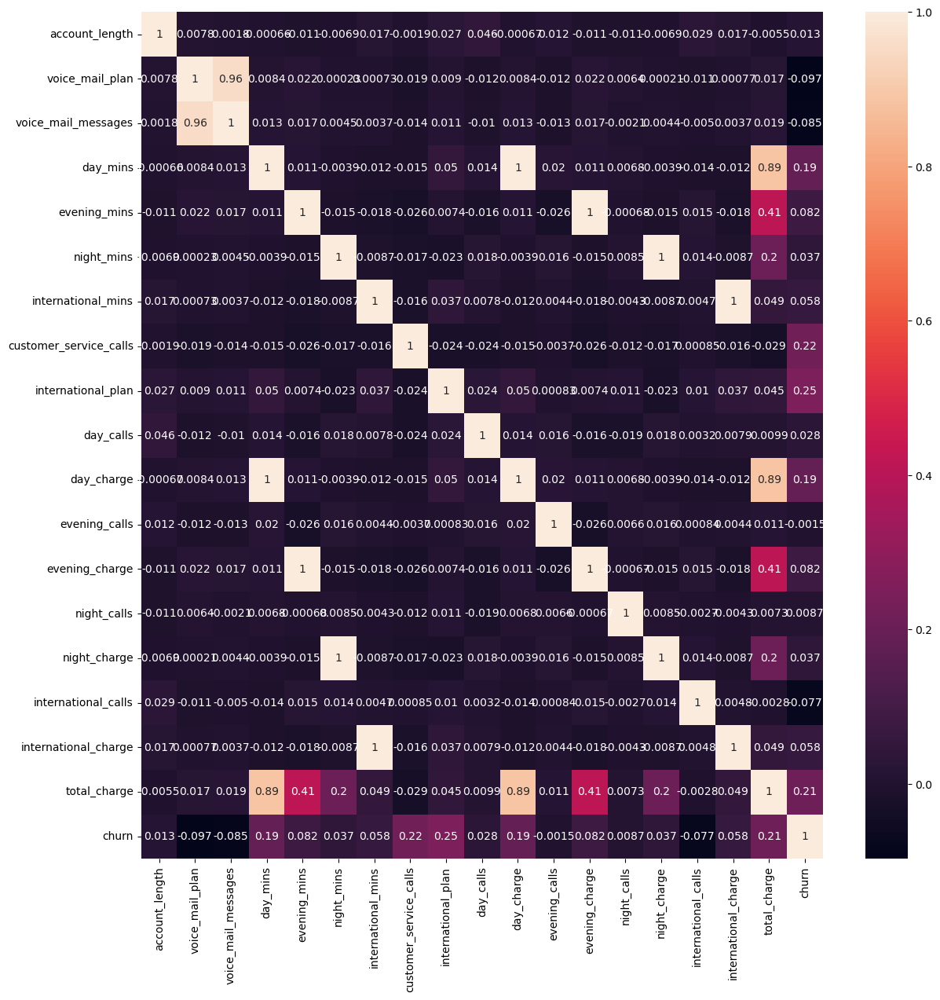

In [23]:
#plotting correlation
plt.figure(figsize=(14,14))
sns.heatmap(corr_matrix, annot=True)
plt.show()

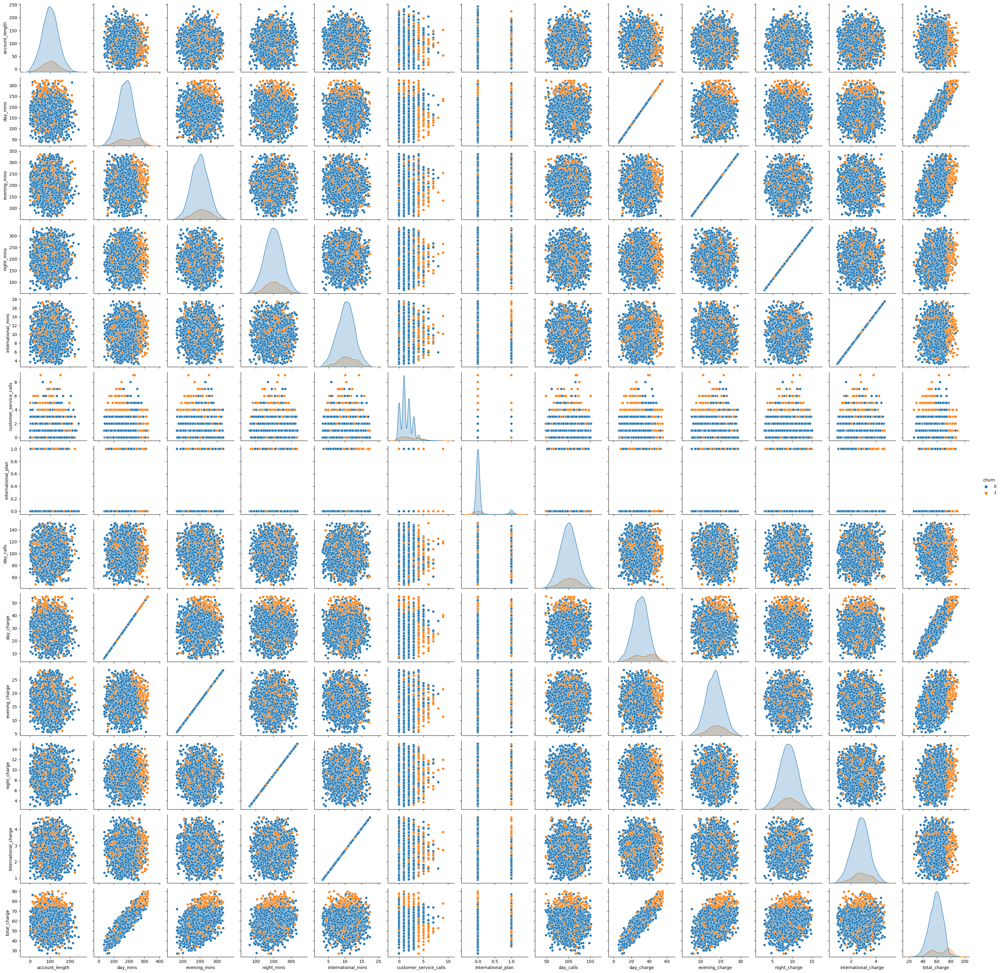

In [24]:
sns.pairplot(df, hue='churn')
plt.show()

<AxesSubplot:xlabel='churn', ylabel='count'>

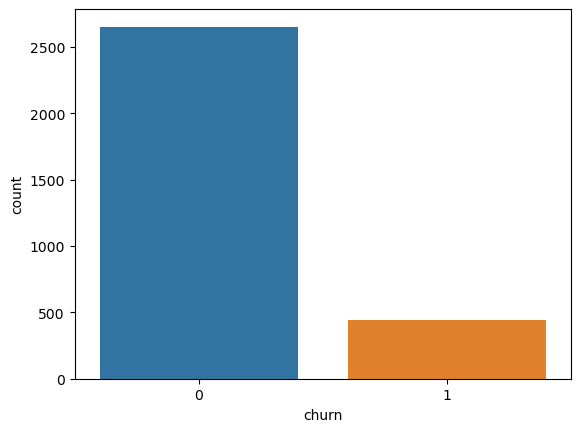

In [25]:
# target variable distribution : shows the dataset is imbalanced. 
sns.countplot(x=df.churn)

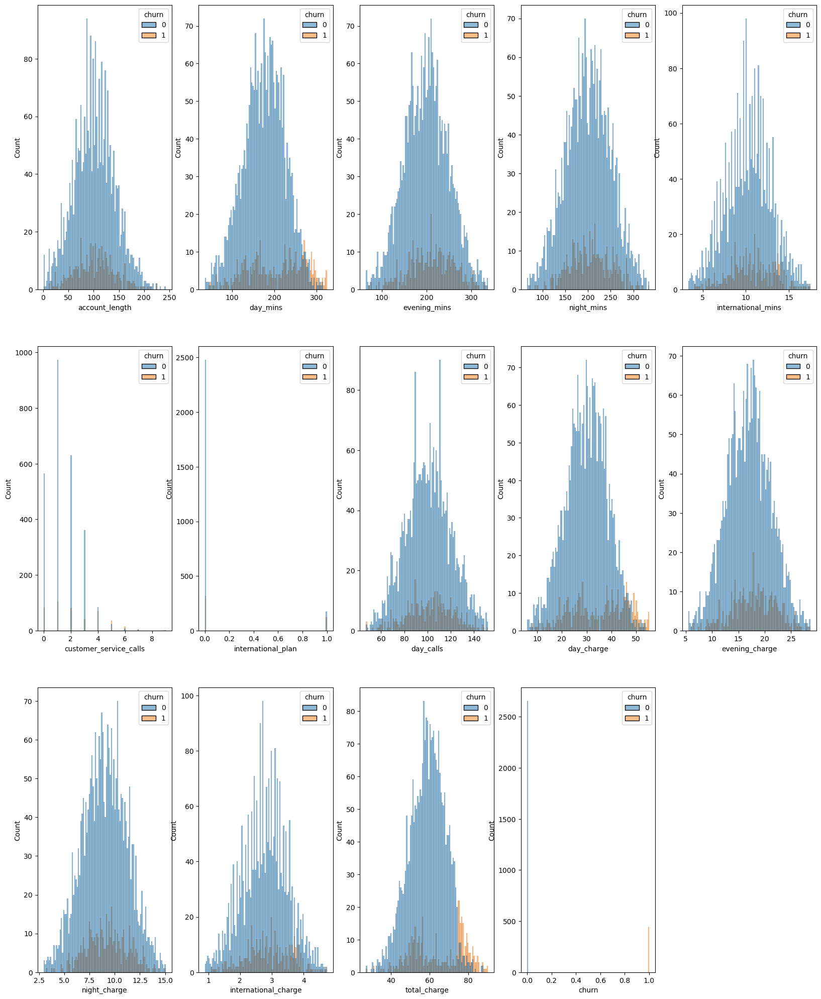

In [26]:
plots_per_row = 5

number_of_plots = df.select_dtypes(exclude=['object']).shape[-1]

fig, axes = plt.subplots((number_of_plots//plots_per_row)+(number_of_plots%5!=0),plots_per_row) 

axes = axes.flatten()
i = 0
for index,col in df.select_dtypes(exclude=['object']).columns.to_series().items():    
    a = sns.histplot(data=df, x=col, hue="churn", ax=axes[i],kde=False,bins=100)
    i+=1
    
for i in range(1,len(axes)-number_of_plots+1):
    fig.delaxes(axes[-i]) # remove empty subplot
# plt.tight_layout()

fig.set_figwidth(20)
fig.set_figheight(25)

plt.show()

this is graph for churn or nonchurn for all the columns

# Isolation forest

In [27]:
from sklearn.ensemble import IsolationForest
clf=IsolationForest(random_state=10,contamination=0.05)
clf.fit(df1)

IsolationForest(contamination=0.05, random_state=10)

In [28]:
y_pred_outliers= clf.predict(df1)
y_pred_outliers

array([ 1,  1,  1, ...,  1, -1,  1])

In [29]:
df1['scores']=clf.decision_function(df1)

In [30]:
df1['anomaly']=clf.predict(df1.iloc[:,0:19])
df1

,account_length,voice_mail_plan,voice_mail_messages,day_mins,evening_mins,night_mins,international_mins,customer_service_calls,international_plan,day_calls,...,evening_calls,evening_charge,night_calls,night_charge,international_calls,international_charge,total_charge,churn,scores,anomaly
0,128,1,25,265.1,197.4,244.7,10.0,1,0,110,...,99,16.78,91,11.01,3,2.70,75.56,0,0.099263,1
1,107,1,26,161.6,195.5,254.4,13.7,1,0,123,...,103,16.62,103,11.45,3,3.70,59.24,0,0.099957,1
2,137,0,0,243.4,121.2,162.6,12.2,0,0,114,...,110,10.30,104,7.32,5,3.29,62.29,0,0.118752,1
3,84,0,0,299.4,61.9,196.9,6.6,2,1,71,...,88,5.26,89,8.86,7,1.78,66.80,0,-0.042985,-1
4,75,0,0,166.7,148.3,186.9,10.1,3,1,113,...,122,12.61,121,8.41,3,2.73,52.09,0,0.081609,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,192,1,36,156.2,215.5,279.1,9.9,2,0,77,...,126,18.32,83,12.56,6,2.67,60.10,0,0.050906,1
3329,68,0,0,231.1,153.4,191.3,9.6,3,0,57,...,55,13.04,123,8.61,4,2.59,63.53,0,0.089930,1
3330,28,0,0,180.8,288.8,191.9,14.1,2,0,109,...,58,24.55,91,8.64,6,3.81,67.74,0,0.081268,1
3331,184,0,0,213.8,159.6,139.2,5.0,2,1,105,...,84,13.57,137,6.26,10,1.35,57.53,0,-0.016507,-1


In [31]:
# this perticular row have outliers
df1[df1['anomaly']==-1]


,account_length,voice_mail_plan,voice_mail_messages,day_mins,evening_mins,night_mins,international_mins,customer_service_calls,international_plan,day_calls,...,evening_calls,evening_charge,night_calls,night_charge,international_calls,international_charge,total_charge,churn,scores,anomaly
3,84,0,0,299.4,61.9,196.9,6.6,2,1,71,...,88,5.26,89,8.86,7,1.78,66.80,0,-0.042985,-1
15,161,0,0,332.9,317.8,160.6,5.4,4,0,67,...,97,27.01,128,7.23,9,1.46,92.29,1,-0.065551,-1
21,77,0,0,62.4,169.9,209.6,5.7,5,0,89,...,121,14.44,64,9.43,6,1.54,36.02,1,-0.037130,-1
32,172,0,0,212.0,31.2,293.3,12.6,3,0,121,...,115,2.65,78,13.20,10,3.40,55.29,0,-0.017616,-1
41,135,1,41,173.1,203.9,122.2,14.6,0,1,85,...,107,17.33,78,5.50,15,3.94,56.20,1,-0.055482,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3275,120,1,27,128.5,163.7,242.9,0.0,1,0,115,...,91,13.91,121,10.93,0,0.00,46.69,0,-0.013857,-1
3287,170,1,42,199.5,135.0,184.6,10.9,4,0,119,...,90,11.48,49,8.31,3,2.94,56.65,1,-0.000530,-1
3291,119,1,22,172.1,223.6,150.0,13.9,1,1,119,...,133,19.01,94,6.75,20,3.75,58.77,1,-0.022803,-1
3322,62,0,0,321.1,265.5,180.5,11.5,4,0,105,...,122,22.57,72,8.12,2,3.11,88.39,1,-0.001486,-1


In [32]:
#segregating dependent and independent features
columns = df.columns.tolist()
#Filter the columns to remove data we do not want
columns = [c for c in columns if c not in ['churn']]
#store the variable we are predicting
target = 'churn'
X = df[columns]
y = df[target]
print(X.shape)
print(y.shape)

(3092, 13)
(3092,)


# Feature selection: chi^2 score

In [33]:
#using SelectKBest class to extract top 10 best features
best_features = SelectKBest(score_func=chi2, k=10)
chi2_fit = best_features.fit(X,y)

In [34]:
dfscores = pd.DataFrame(chi2_fit.scores_)
dfcolumns = pd.DataFrame(X.columns)

In [35]:
#concatnating dataframes for better visualization
featureScores = pd.concat([dfcolumns, dfscores], axis=1)
featureScores.columns = ['Feature','Score'] 

In [36]:
#from this list top n features can be selected for model
featureScores.sort_values(by='Score', ascending=False)

,Feature,Score
1,day_mins,1722.903364
8,day_charge,292.872924
2,evening_mins,251.964454
12,total_charge,244.282155
6,international_plan,179.817429
5,customer_service_calls,161.210341
3,night_mins,50.574966
9,evening_charge,21.410706
7,day_calls,9.227205
0,account_length,7.977263


# Extra Tree classifier

In [37]:
extra_tree_classifier = ExtraTreesClassifier()
etc_fit = extra_tree_classifier.fit(X,y)

In [38]:
print(etc_fit.feature_importances_)

[0.04868159 0.10059186 0.05959384 0.04958835 0.05991774 0.15372527
 0.07044734 0.04809501 0.09725021 0.06106156 0.04889546 0.05573673
 0.14641506]


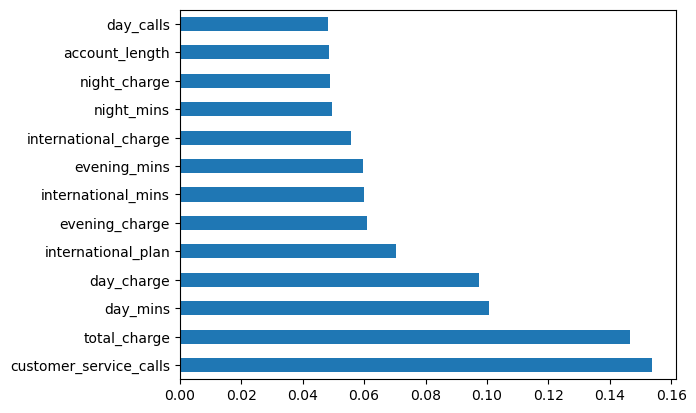

In [39]:
#representing the feature importance data via graph
feat_import = pd.Series(etc_fit.feature_importances_, index=X.columns)
feat_import.nlargest(18).plot(kind='barh')
plt.show()

From Chi2 and Extra Tree Classifier it can be concluded that top 5 features are same, however we are going to go ahead with the Chi2 method of feature selection as the scores are more evident in that. In Extra tree classifier the score towards the end are not very far apart.

In [40]:
#depending upon the chi2 score, dropping all the columns except top 7
#we are selecting top 7 becuse there is sharp decline in score after top 7
feature_engineered_df = df.drop([           'night_mins', 
                                             'evening_charge', 
                                             'account_length',
                                             'international_mins', 
                                             'day_calls', 
                                             'international_charge', 
                                             'night_charge'], axis=1, inplace=False)
feature_engineered_df.head()

,day_mins,evening_mins,customer_service_calls,international_plan,day_charge,total_charge,churn
0,265.1,197.4,1,0,45.07,75.56,0
1,161.6,195.5,1,0,27.47,59.24,0
2,243.4,121.2,0,0,41.38,62.29,0
4,166.7,148.3,3,1,28.34,52.09,0
5,223.4,220.6,0,1,37.98,67.61,0


In [41]:
columns = feature_engineered_df.columns.tolist()
#Filter the columns to remove data we do not want
columns = [c for c in columns if c not in ['churn']]
#store the variable we are predicting
target = 'churn'
X= feature_engineered_df[columns]
y = feature_engineered_df[target]
print(X.shape)
print(y.shape)

(3092, 6)
(3092,)


# XGBoost model

In [42]:
xgboost.XGBClassifier().get_params()

{'objective': 'binary:logistic',
 'use_label_encoder': None,
 'base_score': None,
 'booster': None,
 'callbacks': None,
 'colsample_bylevel': None,
 'colsample_bynode': None,
 'colsample_bytree': None,
 'early_stopping_rounds': None,
 'enable_categorical': False,
 'eval_metric': None,
 'feature_types': None,
 'gamma': None,
 'gpu_id': None,
 'grow_policy': None,
 'importance_type': None,
 'interaction_constraints': None,
 'learning_rate': None,
 'max_bin': None,
 'max_cat_threshold': None,
 'max_cat_to_onehot': None,
 'max_delta_step': None,
 'max_depth': None,
 'max_leaves': None,
 'min_child_weight': None,
 'missing': nan,
 'monotone_constraints': None,
 'n_estimators': 100,
 'n_jobs': None,
 'num_parallel_tree': None,
 'predictor': None,
 'random_state': None,
 'reg_alpha': None,
 'reg_lambda': None,
 'sampling_method': None,
 'scale_pos_weight': None,
 'subsample': None,
 'tree_method': None,
 'validate_parameters': None,
 'verbosity': None}

# model building and evalution

In [43]:
#segregating dependent and independent features
columns = df.columns.tolist()
#Filter the columns to remove data we do not want
columns = [c for c in columns if c not in ['churn']]
#store the variable we are predicting
target = 'churn'
X = df[columns]
y = df[target]
print(X.shape)
print(y.shape)

(3092, 13)
(3092,)


In [44]:
#creating oversampled dataset for training and testing
X= df[columns]
y= df[target]
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.25)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((2319, 13), (773, 13), (2319,), (773,))

In [45]:
model_xgboost = xgboost.XGBClassifier(learning_rate=0.1,
                                      max_depth=3,
                                      n_estimators=250,
                                      subsample=0.5,
                                      colsample_bytree=0.5,
                                      eval_metric='auc',
                                      verbosity=1)
eval_set = [(X_test, y_test)]
model_xgboost.fit(X_train, y_train, early_stopping_rounds=10, eval_set=eval_set, verbose=True)

[0]	validation_0-auc:0.60976
[1]	validation_0-auc:0.83099
[2]	validation_0-auc:0.89714
[3]	validation_0-auc:0.89815
[4]	validation_0-auc:0.89538
[5]	validation_0-auc:0.90530
[6]	validation_0-auc:0.90224
[7]	validation_0-auc:0.90292
[8]	validation_0-auc:0.90765
[9]	validation_0-auc:0.91003
[10]	validation_0-auc:0.91139
[11]	validation_0-auc:0.91291
[12]	validation_0-auc:0.91375
[13]	validation_0-auc:0.91260
[14]	validation_0-auc:0.91277
[15]	validation_0-auc:0.91283
[16]	validation_0-auc:0.91256
[17]	validation_0-auc:0.91020
[18]	validation_0-auc:0.90942
[19]	validation_0-auc:0.90924
[20]	validation_0-auc:0.90990
[21]	validation_0-auc:0.91035


XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=0.5,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric='auc', feature_types=None, gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.1, max_bin=256,
              max_cat_threshold=64, max_cat_to_onehot=4, max_delta_step=0,
              max_depth=3, max_leaves=0, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=250, n_jobs=0,
              num_parallel_tree=1, predictor='auto', random_state=0, ...)

In [46]:
y_train_pred = model_xgboost.predict_proba(X_train)[:,1]
y_test_pred = model_xgboost.predict_proba(X_test)[:,1]
print("AUC Train: {:.4f}\nAUC Test: {:.4f}".format(roc_auc_score(y_train, y_train_pred),
                                                   roc_auc_score(y_test, y_test_pred)))

AUC Train: 0.8983
AUC Test: 0.9138


# Randomforestclassifier

In [47]:
from sklearn.ensemble import RandomForestClassifier
model=RandomForestClassifier(n_estimators=10)
model.fit(X_train,y_train)

RandomForestClassifier(n_estimators=10)

In [48]:
forest_accuracy=model.score(X_test,y_test)
forest_accuracy

0.9366106080206986

In [49]:
y_pred=model.predict(X_test)

# Random Forest Evalution

In [50]:
from sklearn.metrics import confusion_matrix
cm= confusion_matrix(y_test,y_pred)
cm

array([[647,  14],
       [ 35,  77]], dtype=int64)

Text(50.722222222222214, 0.5, 'truth')

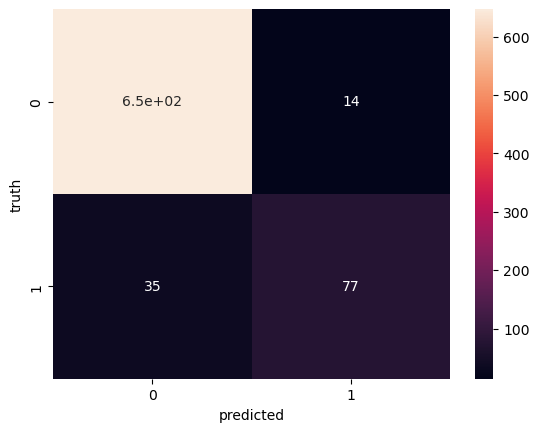

In [51]:
# for better understanding
sns.heatmap(cm,annot=True)
plt.xlabel('predicted')
plt.ylabel('truth')

In [52]:
parameter_space = {
    'n_estimators' : [10,100,500,700,1000]

}
selected_model = RandomForestClassifier()
from sklearn.model_selection import GridSearchCV
GridSearchModel = GridSearchCV(selected_model, parameter_space, cv=2, return_train_score=True)
GridSearchModel.fit(X_train, y_train)

forest_GridTunig = GridSearchModel.best_score_
print('Best Score:', GridSearchModel.best_score_)
print('Best Parameters: ', GridSearchModel.best_params_)
print('Best estimators: ', GridSearchModel.best_estimator_)
print('=====================================================================================')

from sklearn.model_selection import RandomizedSearchCV
RandomizedSearchModel = RandomizedSearchCV(selected_model, parameter_space, cv=2, return_train_score=True, n_iter=5)
RandomizedSearchModel.fit(X_train, y_train)

forest_RandomTunig = RandomizedSearchModel.best_score_
print('Best Score:', RandomizedSearchModel.best_score_)
print('Best Parameters: ', RandomizedSearchModel.best_params_)
print('Best estimators: ', RandomizedSearchModel.best_estimator_)

Best Score: 0.9396298830739936
Best Parameters:  {'n_estimators': 700}
Best estimators:  RandomForestClassifier(n_estimators=700)
Best Score: 0.9391984766891791
Best Parameters:  {'n_estimators': 1000}
Best estimators:  RandomForestClassifier(n_estimators=1000)


In [53]:
from sklearn.metrics import confusion_matrix, classification_report

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.95      0.98      0.96       661
           1       0.85      0.69      0.76       112

    accuracy                           0.94       773
   macro avg       0.90      0.83      0.86       773
weighted avg       0.93      0.94      0.93       773



# Support vector machine(SVM)

In [54]:
from sklearn.svm import SVC
model =SVC(C=30)

In [55]:
model.fit(X_train,y_train)

SVC(C=30)

In [56]:
svm_accuracy=model.score(X_test,y_test)
svm_accuracy

0.869340232858991

In [57]:
y_pred=model.predict(X_test)

# SVM Evalution

In [58]:
cm= confusion_matrix(y_test,y_pred)
cm

array([[656,   5],
       [ 96,  16]], dtype=int64)

Text(50.722222222222214, 0.5, 'truth')

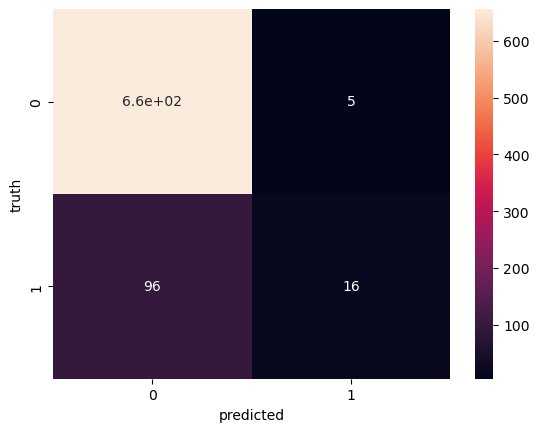

In [59]:
sns.heatmap(cm,annot=True)
plt.xlabel('predicted')
plt.ylabel('truth')

increasing regularisation increase score

In [60]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.87      0.99      0.93       661
           1       0.76      0.14      0.24       112

    accuracy                           0.87       773
   macro avg       0.82      0.57      0.58       773
weighted avg       0.86      0.87      0.83       773



# LogisticRegression

In [61]:
from sklearn.linear_model import LogisticRegression

In [62]:
model =LogisticRegression(C=70)

In [63]:
model.fit(X_train,y_train)

LogisticRegression(C=70)

In [64]:
y_pred=model.predict(X_test)

In [65]:
log_accuracy=model.score(X_test,y_test)
log_accuracy

0.8447606727037517

In [66]:
y_pred=model.predict(X_test)

# Logistic Evalution

In [67]:
cm= confusion_matrix(y_test,y_pred)
cm

array([[639,  22],
       [ 98,  14]], dtype=int64)

Text(50.722222222222214, 0.5, 'truth')

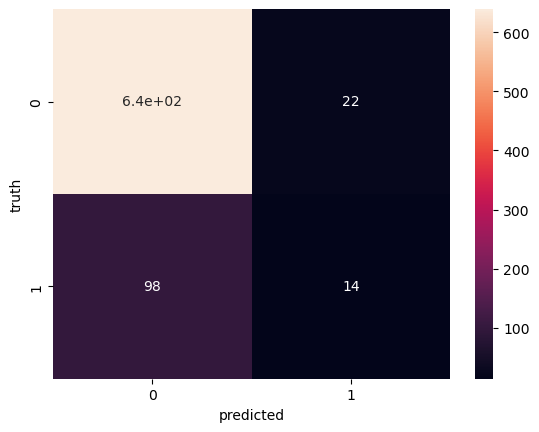

In [68]:
sns.heatmap(cm,annot=True)
plt.xlabel('predicted')
plt.ylabel('truth')

In [69]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.87      0.97      0.91       661
           1       0.39      0.12      0.19       112

    accuracy                           0.84       773
   macro avg       0.63      0.55      0.55       773
weighted avg       0.80      0.84      0.81       773



In [70]:
from sklearn.model_selection import KFold
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import mean_absolute_error

In [71]:
kf = KFold(n_splits=4)
mae_train = []
mae_test = []
for train_index, test_index in kf.split(X):
    
   X_train, X_test = X.iloc[train_index], X.iloc[test_index]
   y_train, y_test = y.iloc[train_index], y.iloc[test_index]
   model = KNeighborsClassifier(n_neighbors=2)
   model.fit(X_train, y_train)
   y_train_pred = model.predict(X_train)
   y_test_pred = model.predict(X_test)
   mae_train.append(mean_absolute_error(y_train, y_train_pred))
   mae_test.append(mean_absolute_error(y_test, y_test_pred))

In [72]:
kfold_accuracy=model.score(X_train,y_train)
kfold_accuracy

0.8982319965502372

In [73]:
y_pred=model.predict(X_test)

# KNeighborsClassifier  Evalution

In [74]:
cm= confusion_matrix(y_test,y_pred)
cm

array([[634,  13],
       [109,  17]], dtype=int64)

Text(50.722222222222214, 0.5, 'truth')

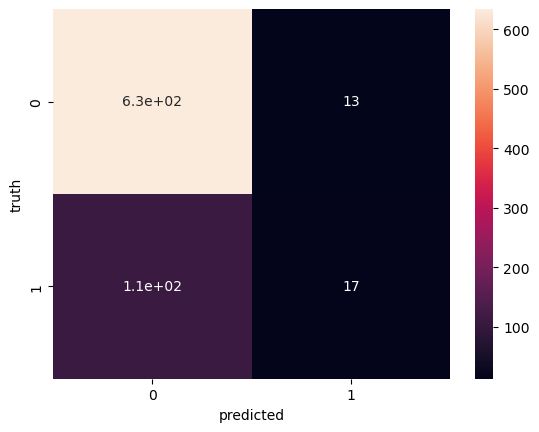

In [75]:
sns.heatmap(cm,annot=True)
plt.xlabel('predicted')
plt.ylabel('truth')

In [76]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.85      0.98      0.91       647
           1       0.57      0.13      0.22       126

    accuracy                           0.84       773
   macro avg       0.71      0.56      0.57       773
weighted avg       0.81      0.84      0.80       773



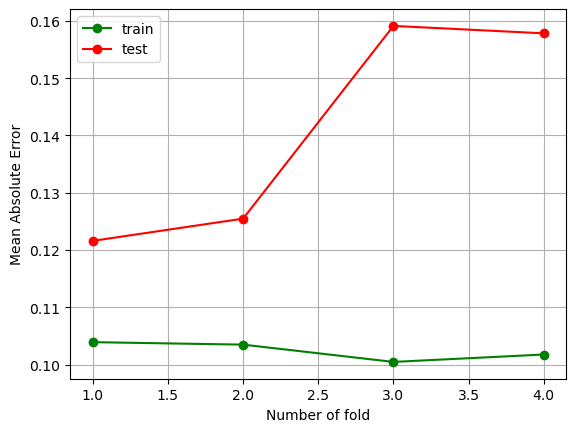

In [77]:
folds = range(1, kf.get_n_splits() + 1)
plt.plot(folds, mae_train, 'o-', color='green', label='train')
plt.plot(folds, mae_test, 'o-', color='red', label='test')
plt.legend()
plt.grid()
plt.xlabel('Number of fold')
plt.ylabel('Mean Absolute Error')
plt.show()

# Decisiontreeclassifier

In [78]:
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier


In [79]:
 tree=DecisionTreeClassifier()

In [80]:
tree.fit(X_train,y_train)

DecisionTreeClassifier()

In [81]:
y_pred=model.predict(X_test)


In [82]:
tree_accuracy=model.score(X_train, y_train)
tree_accuracy

0.8982319965502372

# Decisiontree Evaluation

In [83]:
cm=confusion_matrix(y_test,y_pred)
cm

array([[634,  13],
       [109,  17]], dtype=int64)

Text(50.722222222222214, 0.5, 'truth')

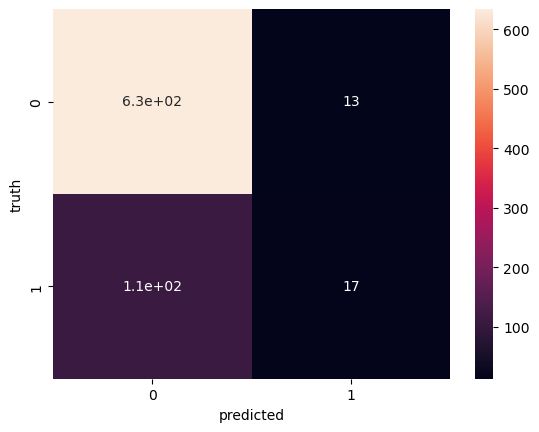

In [84]:
sns.heatmap(cm,annot=True)
plt.xlabel('predicted')
plt.ylabel('truth')

In [85]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.85      0.98      0.91       647
           1       0.57      0.13      0.22       126

    accuracy                           0.84       773
   macro avg       0.71      0.56      0.57       773
weighted avg       0.81      0.84      0.80       773



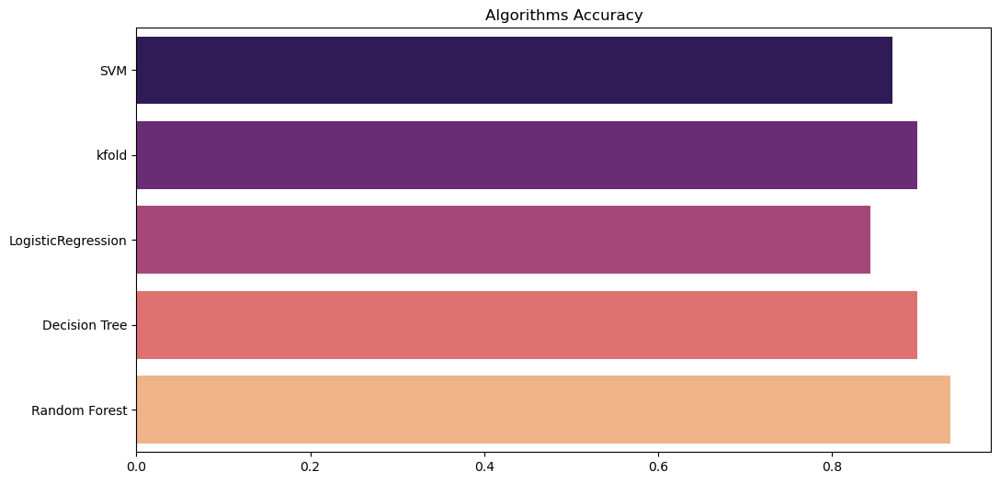

In [86]:
# comparison between Algorithms without hyperparameter tuning 
plt.figure(figsize=(12, 6))
algorithm_accuracy = [svm_accuracy, kfold_accuracy, log_accuracy, tree_accuracy, forest_accuracy]
algorithm_name = ['SVM', 'kfold', 'LogisticRegression', 'Decision Tree', 'Random Forest']

sns.barplot(x=algorithm_accuracy, y=algorithm_name, palette='magma')
plt.title('Algorithms Accuracy')
plt.show()


